In [2]:
# Import packages
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, TimeSeriesSplit
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import StandardScaler, LabelEncoder
import numpy as np
from sklearn.metrics import mean_squared_error
from collections import defaultdict

## Merging Data

In [50]:
yield_weather_soil_df = pd.read_csv('historical_ywse_cleaned.csv')
df = yield_weather_soil_df
print(df.head())

      crop                        state  year  season  yield  \
0  Sesamum  Andaman and Nicobar Islands  1998  Summer    0.0   
1  Sesamum  Andaman and Nicobar Islands  1998  Autumn    0.0   
2  Sesamum  Andaman and Nicobar Islands  1998  Winter    0.0   
3  Sesamum  Andaman and Nicobar Islands  1999  Summer    0.0   
4  Sesamum  Andaman and Nicobar Islands  1999  Autumn    0.0   

   temperature_2m_min  temperature_2m_max  precipitation_sum  rain_sum  \
0           26.812971           29.232831           6.618692  6.618692   
1           19.147960           28.225199           3.347841  3.347670   
2           19.147960           28.225199           3.347841  3.347670   
3           26.135401           28.180261           7.464953  7.464953   
4           19.147960           28.225199           3.347841  3.347670   

   snowfall_sum  Mean_N_SOIL  Mean_P_SOIL  Mean_K_SOIL  Mean_TEMPERATURE  \
0       0.00000    81.466667    50.133333    40.333333         23.536551   
1       0.00012   

## Understanding the Data

### Finding shape of data and confirming no missing values in each column

In [51]:
print(df.shape)
# Count the number of NaN values in each column
nan_counts = df.isna().sum()

# Print the result
print("Number of NaN values in each column:")
for column, count in nan_counts.items():
    print(f"{column}: {count}")


(11700, 20)
Number of NaN values in each column:
crop: 0
state: 0
year: 0
season: 0
yield: 0
temperature_2m_min: 0
temperature_2m_max: 0
precipitation_sum: 0
rain_sum: 0
snowfall_sum: 0
Mean_N_SOIL: 0
Mean_P_SOIL: 0
Mean_K_SOIL: 0
Mean_TEMPERATURE: 0
Mean_HUMIDITY: 0
Mean_RAINFALL: 0
Mean_PH: 0
Inflation annual %: 0
Real GDP annual growth %: 0
Population: 0


### Accounting for Missing Data

In [52]:
df = df.dropna()
print(df.shape)
# Count the number of NaN values in each column
nan_counts = df.isna().sum()

# Print the result
print("Number of NaN values in each column:")
for column, count in nan_counts.items():
    print(f"{column}: {count}")


(11700, 20)
Number of NaN values in each column:
crop: 0
state: 0
year: 0
season: 0
yield: 0
temperature_2m_min: 0
temperature_2m_max: 0
precipitation_sum: 0
rain_sum: 0
snowfall_sum: 0
Mean_N_SOIL: 0
Mean_P_SOIL: 0
Mean_K_SOIL: 0
Mean_TEMPERATURE: 0
Mean_HUMIDITY: 0
Mean_RAINFALL: 0
Mean_PH: 0
Inflation annual %: 0
Real GDP annual growth %: 0
Population: 0


In [53]:
# Remove duplicate rows based on the combination of 'crop', 'state', 'year', and 'season'
duplicate_rows = df[df.duplicated(subset=['crop', 'state', 'year', 'season'], keep=False)]
df.drop_duplicates(subset=['crop', 'state', 'year', 'season'], keep='first', inplace=True)

In [54]:
all_crops = df['crop'].unique()
all_states = df['state'].unique()
all_seasons = df['season'].unique()
all_years = range(1998, 2024)

all_combinations = pd.DataFrame([(crop, state, year, season) for crop in all_crops for state in all_states for year in all_years for season in all_seasons],
                                columns=['crop', 'state', 'year', 'season'])

merged_df = pd.merge(all_combinations, df, on=['crop', 'state', 'year', 'season'], how='left')

# Replace missing yield values with 0
merged_df['yield'].fillna(0, inplace=True)

# Replace missing values in other columns with the mean value for that column
columns_to_fill = merged_df.columns.difference(['crop', 'state', 'year', 'season', 'yield'])
for column in columns_to_fill:
    mean_value = merged_df[column].mean()
    merged_df[column].fillna(mean_value, inplace=True)
    
df = merged_df
print(df.shape)
df.head()

(63882, 20)


/var/folders/y0/0b_29ywn0sd8471fpn4trq3h0000gn/T/ipykernel_81830/1354391293.py:12: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_df['yield'].fillna(0, inplace=True)
/var/folders/y0/0b_29ywn0sd8471fpn4trq3h0000gn/T/ipykernel_81830/1354391293.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always b

,crop,state,year,season,yield,temperature_2m_min,temperature_2m_max,precipitation_sum,rain_sum,snowfall_sum,Mean_N_SOIL,Mean_P_SOIL,Mean_K_SOIL,Mean_TEMPERATURE,Mean_HUMIDITY,Mean_RAINFALL,Mean_PH,Inflation annual %,Real GDP annual growth %,Population
0,Sesamum,Andaman and Nicobar Islands,1998,Summer,0.0,26.812971,29.232831,6.618692,6.618692,0.00000,81.466667,50.133333,40.333333,23.536551,81.890278,240.609670,6.628980,13.230839,6.184416,1.021435e+09
1,Sesamum,Andaman and Nicobar Islands,1998,Autumn,0.0,19.147960,28.225199,3.347841,3.347670,0.00012,57.655611,43.953296,36.220298,24.270298,73.896961,119.087588,6.445453,6.347550,6.193452,1.241857e+09
2,Sesamum,Andaman and Nicobar Islands,1998,Winter,0.0,19.147960,28.225199,3.347841,3.347670,0.00012,57.655611,43.953296,36.220298,24.270298,73.896961,119.087588,6.445453,6.347550,6.193452,1.241857e+09
3,Sesamum,Andaman and Nicobar Islands,1999,Summer,0.0,26.135401,28.180261,7.464953,7.464953,0.00000,81.466667,50.133333,40.333333,23.536551,81.890278,240.609670,6.628980,4.669820,8.845756,1.040500e+09
4,Sesamum,Andaman and Nicobar Islands,1999,Autumn,0.0,19.147960,28.225199,3.347841,3.347670,0.00012,57.655611,43.953296,36.220298,24.270298,73.896961,119.087588,6.445453,6.347550,6.193452,1.241857e+09


In [55]:
# Group by 'state' and 'crop', then filter out rows where all values in 'yield' column are zero
filtered_df = df.groupby(['state', 'crop']).filter(lambda x: (x['yield'] != 0).any())
df = filtered_df.reset_index(drop=True)
print(df.shape)
df.head()

(11700, 20)


,crop,state,year,season,yield,temperature_2m_min,temperature_2m_max,precipitation_sum,rain_sum,snowfall_sum,Mean_N_SOIL,Mean_P_SOIL,Mean_K_SOIL,Mean_TEMPERATURE,Mean_HUMIDITY,Mean_RAINFALL,Mean_PH,Inflation annual %,Real GDP annual growth %,Population
0,Sesamum,Andaman and Nicobar Islands,1998,Summer,0.0,26.812971,29.232831,6.618692,6.618692,0.00000,81.466667,50.133333,40.333333,23.536551,81.890278,240.609670,6.628980,13.230839,6.184416,1.021435e+09
1,Sesamum,Andaman and Nicobar Islands,1998,Autumn,0.0,19.147960,28.225199,3.347841,3.347670,0.00012,57.655611,43.953296,36.220298,24.270298,73.896961,119.087588,6.445453,6.347550,6.193452,1.241857e+09
2,Sesamum,Andaman and Nicobar Islands,1998,Winter,0.0,19.147960,28.225199,3.347841,3.347670,0.00012,57.655611,43.953296,36.220298,24.270298,73.896961,119.087588,6.445453,6.347550,6.193452,1.241857e+09
3,Sesamum,Andaman and Nicobar Islands,1999,Summer,0.0,26.135401,28.180261,7.464953,7.464953,0.00000,81.466667,50.133333,40.333333,23.536551,81.890278,240.609670,6.628980,4.669820,8.845756,1.040500e+09
4,Sesamum,Andaman and Nicobar Islands,1999,Autumn,0.0,19.147960,28.225199,3.347841,3.347670,0.00012,57.655611,43.953296,36.220298,24.270298,73.896961,119.087588,6.445453,6.347550,6.193452,1.241857e+09


In [56]:
total_crop_yield = []
unique_crops = df['crop'].unique()
for crop in unique_crops:
    crop_yield_sum = df[(df['crop'] == crop)]['yield'].sum()
    total_crop_yield.append((crop, crop_yield_sum))
    
sorted_total_crop_yield = sorted(total_crop_yield, key = lambda x: x[1] ,reverse=True)
for (c, y) in sorted_total_crop_yield:
    print(f"Total yield of {c}: {y}")

Total yield of Sugarcane: 2764.75
Total yield of Maize: 1531.27
Total yield of Rice: 1446.0900000000001
Total yield of Potato: 839.36
Total yield of Onion: 802.11
Total yield of Banana: 657.8
Total yield of Groundnut: 229.42
Total yield of Ragi: 149.02
Total yield of Sesamum: 135.51999999999998
Total yield of Jute: 131.36
Total yield of Dry Chillies: 131.15
Total yield of Bajra: 109.25999999999999
Total yield of Moong: 87.23999999999998
Total yield of Brinjal: 69.27000000000001
Total yield of Urad: 69.11
Total yield of Wheat: 68.44
Total yield of Jowar: 64.38
Total yield of Sunflower: 53.89
Total yield of Tobacco: 39.5
Total yield of Peas & Beans: 32.809999999999995
Total yield of Cotton: 20.5
Total yield of Rapeseed & Mustard: 19.25
Total yield of Small Millets: 16.29
Total yield of Gram: 13.23
Total yield of Horse-gram: 12.78
Total yield of Other Summer Pulses: 8.469999999999999
Total yield of Arhar/Tur: 8.05
Total yield of Sannhamp: 7.55
Total yield of Niger seed: 7.040000000000001


In [57]:
# Select crops whose yield is more than or equal to 100
selected_crops = [c for (c, y) in sorted_total_crop_yield if y >= 100]

# Filter rows from df for selected crops
df = df[df['crop'].isin(selected_crops)]

# Print unique crops in the DataFrame
unique_crops = df['crop'].unique()
print("Unique crops in the DataFrame that have at least 100 Ton./Ha.:")
for crop in unique_crops:
    print(crop)

Unique crops in the DataFrame that have at least 100 Ton./Ha.:
Sesamum
Rice
Maize
Onion
Bajra
Groundnut
Dry Chillies
Potato
Ragi
Banana
Jute
Sugarcane


### Feature Selection

In [58]:
# Drop non-numeric columns
df_non_categorical = df.drop(['year', 'state', 'crop', 'season'], axis=1)

X = df_non_categorical.drop('yield', axis=1) # features
y = df_non_categorical['yield'] # target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
selected_features = X.columns[lasso.coef_ != 0]
print("Selected features: ", selected_features)

Selected features:  Index(['temperature_2m_min', 'temperature_2m_max', 'precipitation_sum',
       'rain_sum', 'Mean_N_SOIL', 'Mean_P_SOIL', 'Mean_K_SOIL',
       'Mean_HUMIDITY', 'Mean_RAINFALL', 'Inflation annual %',
       'Real GDP annual growth %', 'Population'],
      dtype='object')


### DF after Feature Selection

In [39]:
df_full = df[['year', 'season', 'state', 'crop', 'yield','temperature_2m_min', 'temperature_2m_max', 'precipitation_sum',
       'rain_sum', 'Mean_N_SOIL', 'Mean_P_SOIL', 'Mean_K_SOIL',
       'Mean_HUMIDITY', 'Mean_RAINFALL', 'Inflation annual %',
       'Real GDP annual growth %', 'Population']]

def map_season(season):
    return '04-30' if season == 'Summer' else ('08-31' if season == 'Autumn' else '12-31')

df_full['Year_Season'] = df_full.apply(lambda row: str(row['year']) + '-' + map_season(row['season']), axis=1)
df_full = df_full.sort_values('Year_Season')
df_full['Year_Season'] = pd.to_datetime(df_full['Year_Season'], format='mixed').dt.floor('D')
df_full.reset_index(drop=True, inplace=True)
df_full = df_full.drop(columns=['year', 'season'])
df_full.head()
#df_full.to_csv('df_full.csv', index=False)

/var/folders/y0/0b_29ywn0sd8471fpn4trq3h0000gn/T/ipykernel_65147/1805212320.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_full['Year_Season'] = df_full.apply(lambda row: str(row['year']) + '-' + map_season(row['season']), axis=1)


,state,crop,yield,temperature_2m_min,temperature_2m_max,precipitation_sum,rain_sum,Mean_N_SOIL,Mean_P_SOIL,Mean_K_SOIL,Mean_HUMIDITY,Mean_RAINFALL,Inflation annual %,Real GDP annual growth %,Population,Year_Season
0,Andaman and Nicobar Islands,Sesamum,0.00,26.812971,29.232831,6.618692,6.618692,81.466667,50.133333,40.333333,81.890278,240.609670,13.230839,6.184416,1.021435e+09,1998-04-30
1,Puducherry,Ragi,0.00,27.191948,32.099425,2.010280,2.010280,99.714286,79.714286,51.428571,79.276878,113.565653,13.230839,6.184416,1.021435e+09,1998-04-30
2,Meghalaya,Rice,0.00,17.282247,22.485285,20.807009,20.807009,23.666667,22.000000,39.166667,88.217547,108.647579,13.230839,6.184416,1.021435e+09,1998-04-30
3,Odisha,Ragi,0.71,22.329860,30.508364,6.597196,6.597196,54.930233,45.662791,44.441860,85.828090,106.076634,13.230839,6.184416,1.021435e+09,1998-04-30
4,Odisha,Rice,0.00,22.329860,30.508364,6.597196,6.597196,54.930233,45.662791,44.441860,85.828090,106.076634,13.230839,6.184416,1.021435e+09,1998-04-30


### Training and Testing of LSTM model on each crop on the National Level

Baseline LSTM Model

/var/folders/y0/0b_29ywn0sd8471fpn4trq3h0000gn/T/ipykernel_81830/2436569531.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_lstm['Year_Season'] = df_lstm.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)


RMSE for crop Bajra: 1.6233657598495483
RMSE for crop Banana: 21.62640953063965
RMSE for crop Dry Chillies: 5.502391338348389
RMSE for crop Groundnut: 3.3626527786254883
RMSE for crop Jute: 4.357924461364746
RMSE for crop Maize: 12.937820434570312
RMSE for crop Onion: 17.135189056396484
RMSE for crop Potato: 14.691664695739746
RMSE for crop Ragi: 1.5259895324707031
RMSE for crop Rice: 15.122769355773926
RMSE for crop Sesamum: 4.210314750671387
RMSE for crop Sugarcane: 39.63560104370117


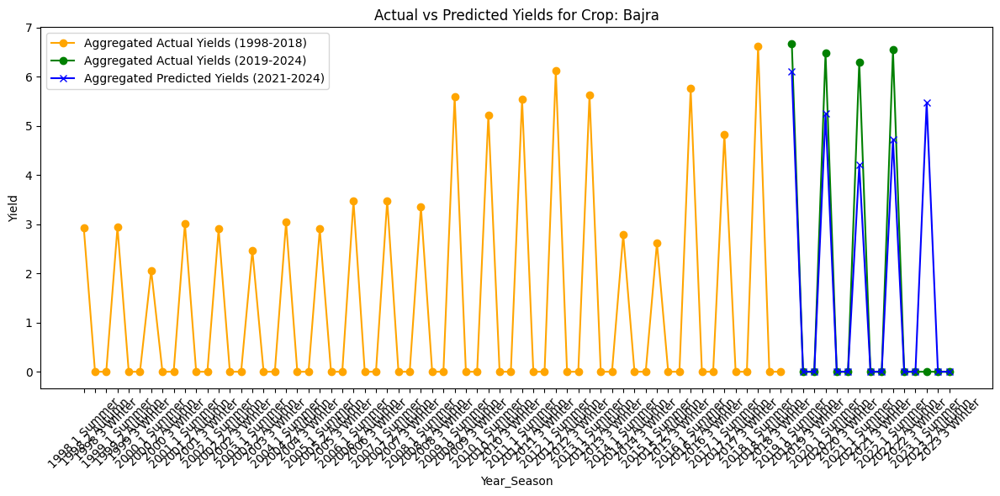

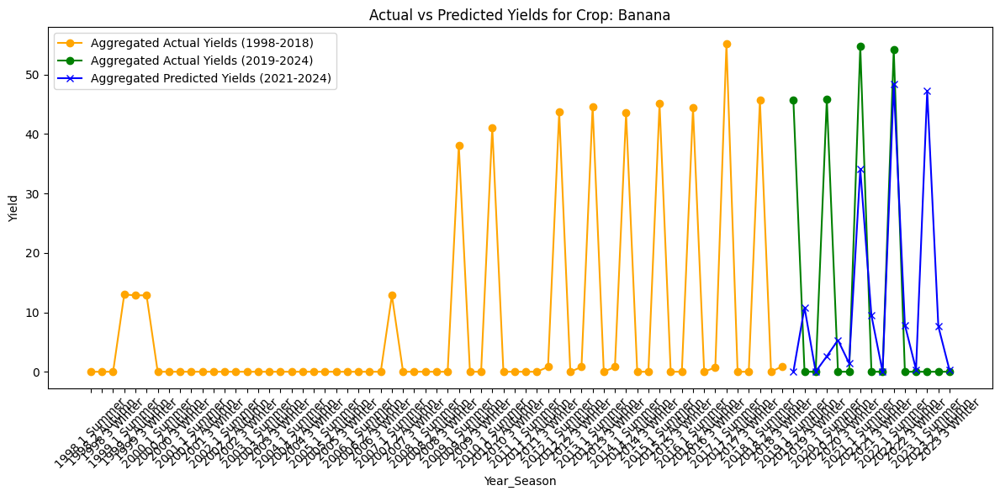

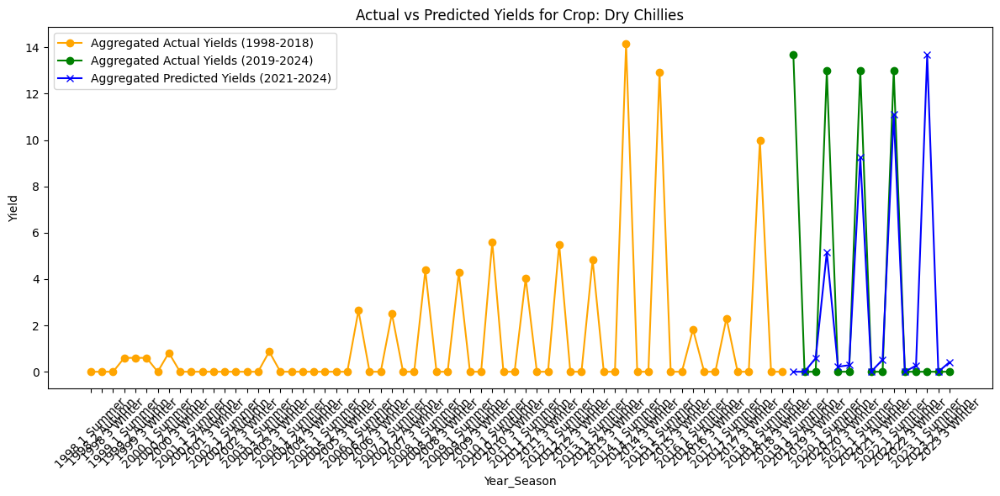

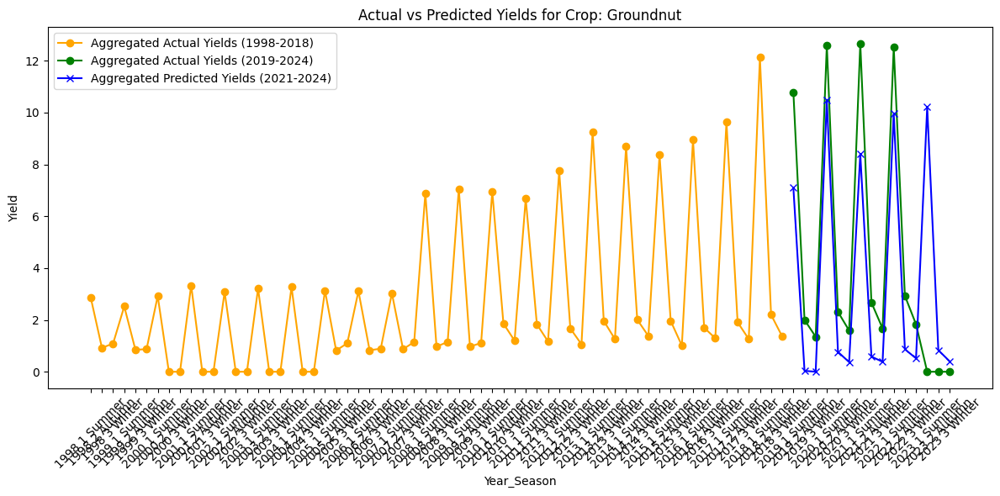

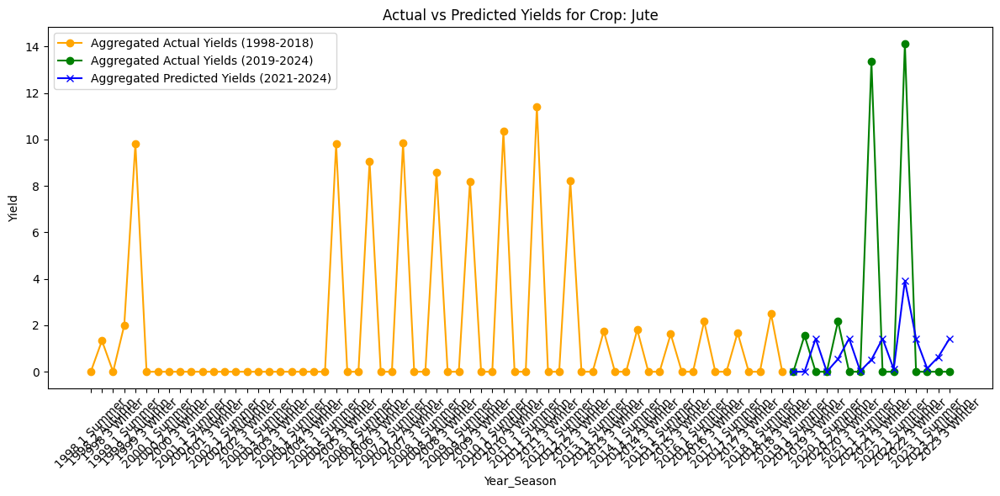

...

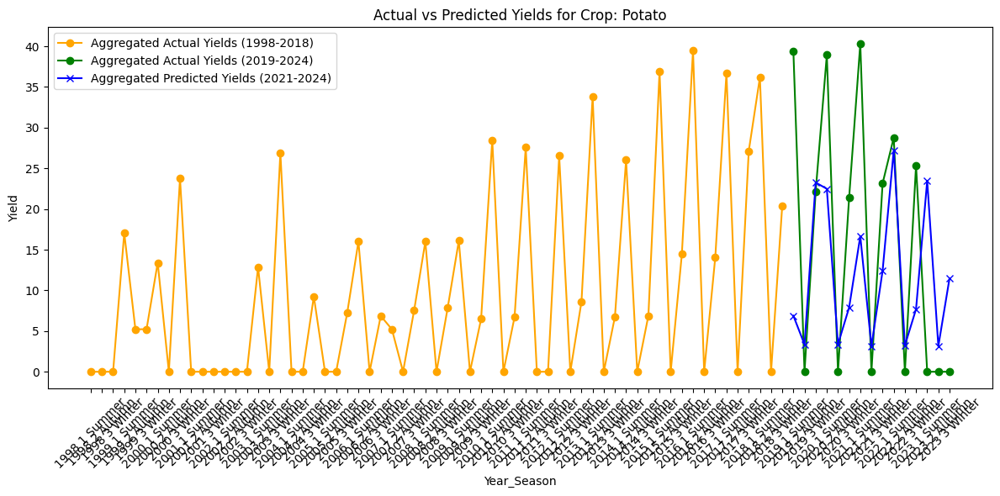

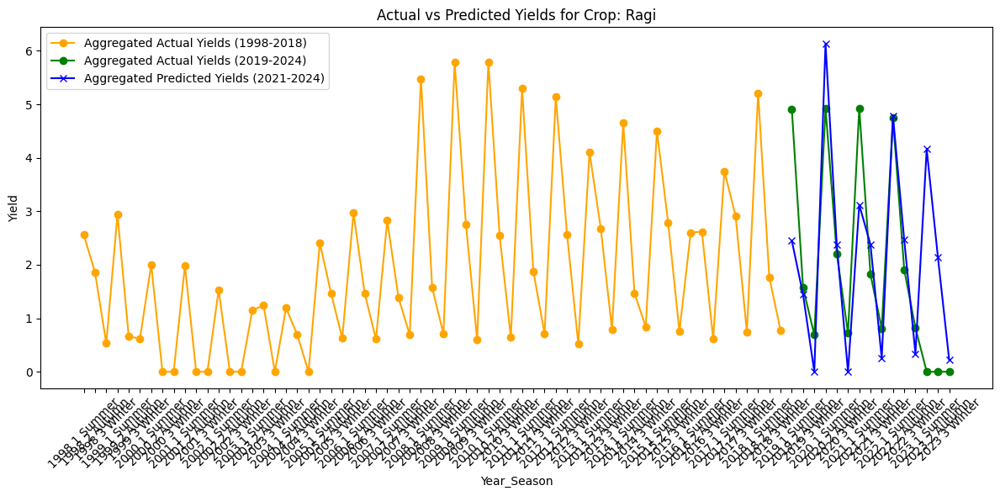

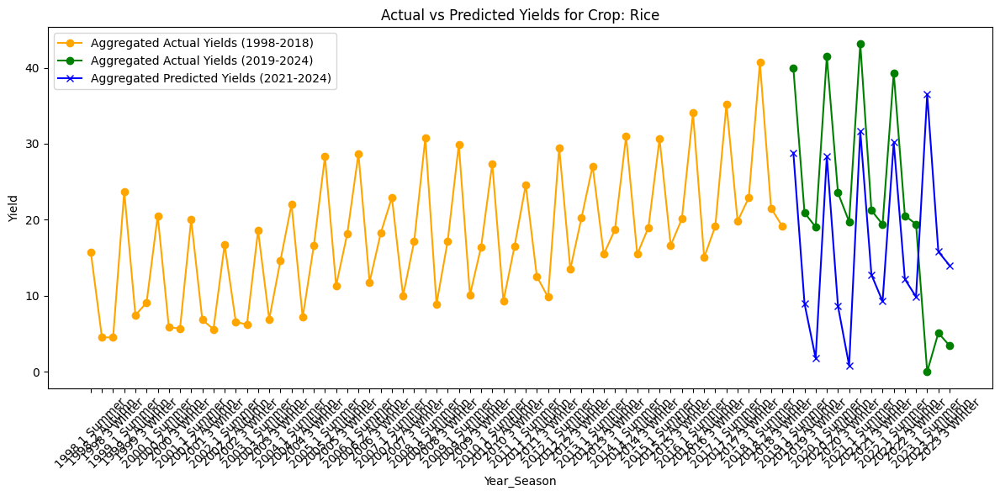

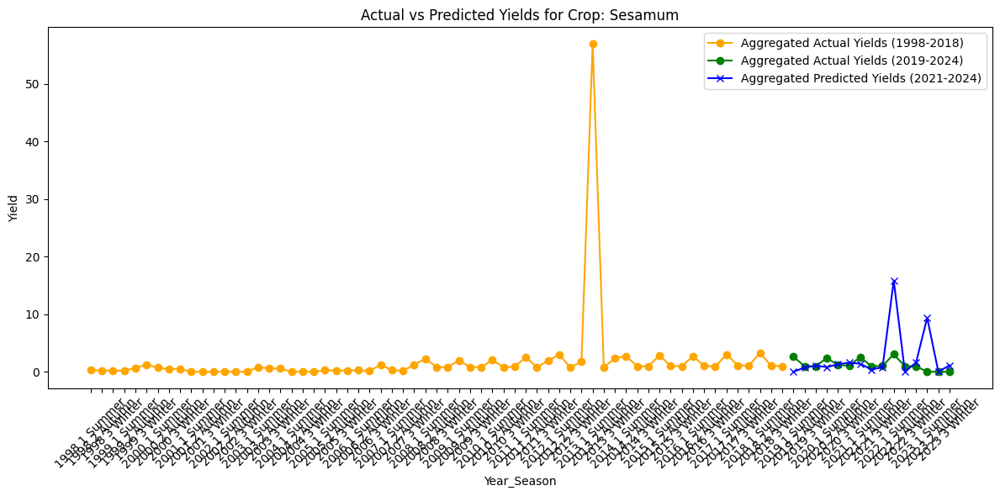

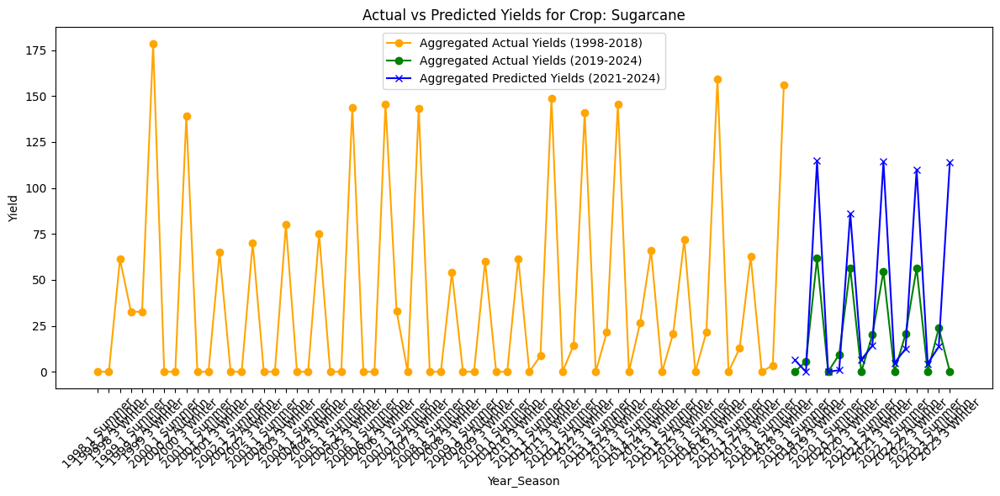

Average RMSE across all crops: 11.811008


In [60]:
df_lstm = df[['year', 'season', 'state', 'crop', 'yield','temperature_2m_min', 'temperature_2m_max', 'precipitation_sum',
       'rain_sum', 'Mean_N_SOIL', 'Mean_P_SOIL', 'Mean_K_SOIL',
       'Mean_HUMIDITY', 'Mean_RAINFALL', 'Inflation annual %',
       'Real GDP annual growth %', 'Population']]

def map_season(season):
    return '1' if season == 'Summer' else ('2' if season == 'Autumn' else '3')

df_lstm['Year_Season'] = df_lstm.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
df_lstm = df_lstm.sort_values('Year_Season')
df_lstm.reset_index(drop=True, inplace=True)

# Group by 'Year_Season' and 'crop' and then split
df_grouped = df_lstm.groupby(['Year_Season', 'crop']).agg({
    'yield': 'sum',
    'temperature_2m_min': 'mean',
    'temperature_2m_max': 'mean',
    'precipitation_sum': 'mean',
    'rain_sum': 'mean',
    'Mean_N_SOIL': 'mean',
    'Mean_P_SOIL': 'mean',
    'Mean_K_SOIL': 'mean',
    'Mean_HUMIDITY': 'mean',
    'Mean_RAINFALL': 'mean',
    'Inflation annual %' : 'mean',
    'Real GDP annual growth %' : 'mean',
    'Population' : 'mean'
}).reset_index()

df_grouped.head()

# Baseline LSTM model
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_layer_size=100, output_size=1):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = nn.LSTM(input_size, hidden_layer_size)
        self.linear = nn.Linear(hidden_layer_size, output_size)
        self.hidden_cell = (torch.zeros(1,1,self.hidden_layer_size),
                            torch.zeros(1,1,self.hidden_layer_size))

    def forward(self, input_seq):
        lstm_out, self.hidden_cell = self.lstm(input_seq.view(len(input_seq), 1, -1), self.hidden_cell)
        predictions = self.linear(lstm_out.view(len(input_seq), -1))
        return predictions[-1]

# Function to preprocess data
def preprocess_data(data, columns_to_encode):
    label_encoders = {}
    for column in columns_to_encode:
        if column not in label_encoders:
            label_encoders[column] = LabelEncoder()
        data[column] = label_encoders[column].fit_transform(data[column])
    numerical_data = data.select_dtypes(include=[np.number])
    scaler = StandardScaler()
    return torch.tensor(scaler.fit_transform(numerical_data.values)).float()

# Define the range of years for training and testing
train_years = list(range(1998, 2019))  # This includes 1998 to 2018
test_years = list(range(2019, 2025))   # This includes 2019 to 2024

# Define logic for splitting the grouped data into training and test sets
def split_data(data, train_years, test_years):
    # Create a copy of the data to avoid pandas warning
    data = data.copy()

    # Extract year and season from 'Year_Season'
    data['year_from_year_season'] = data['Year_Season'].apply(lambda x: int(x.split(' ')[0]))
    data['extracted_season'] = data['Year_Season'].apply(lambda x: x.split(' ')[-1])
    data['season_encoded'] = data['extracted_season'].apply(map_season)

    train_data = data[data['year_from_year_season'].isin(train_years)]
    test_data = data[data['year_from_year_season'].isin(test_years)]

    # Drop the temporary columns
    train_data = train_data.drop(columns=['year_from_year_season', 'extracted_season'])
    test_data = test_data.drop(columns=['year_from_year_season', 'extracted_season'])

    return train_data, test_data

# LSTM model training and predictions for each crop
crop_rmse_scores = {}
crop_actual_yields = {}
crop_predicted_yields = {}
crop_year_seasons = {}

# Initialize dictionaries for each crop before the loop
for crop in df_grouped['crop'].unique():
    crop_predicted_yields[crop] = []
    crop_actual_yields[crop] = []
    crop_year_seasons[crop] = []
    crop_rmse_scores[crop] = []

# Iterate over each crop and perform LSTM training and prediction
for crop in df_grouped['crop'].unique():
    crop_data = df_grouped[df_grouped['crop'] == crop]
    
    # Split crop_data into train and test sets using the updated split function
    train_data, test_data = split_data(crop_data, train_years, test_years)

    X_train = preprocess_data(train_data.drop(columns=['yield', 'Year_Season', 'crop']), ['season_encoded'])
    y_train = torch.tensor(train_data['yield'].values).float()
    X_test = preprocess_data(test_data.drop(columns=['yield', 'Year_Season', 'crop']), ['season_encoded'])
    y_test = torch.tensor(test_data['yield'].values).float()


    input_size = X_train.shape[1]  # Set input_size for the LSTM model
    model = LSTMModel(input_size=input_size)
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    # Training Loop
    model.train()
    for epoch in range(150):  # Adjust number of epochs as needed
        for X_batch, y_batch in DataLoader(TensorDataset(X_train, y_train), batch_size=1, shuffle=False):
            optimizer.zero_grad()
            model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
                                torch.zeros(1, 1, model.hidden_layer_size))
            
            y_pred = model(X_batch)
            # Ensure that both y_pred and y_batch are 2D tensors with the same shape
            loss_function = nn.MSELoss()
            single_loss = loss_function(y_pred.view(-1, 1), y_batch.view(-1, 1))
            single_loss.backward()
            optimizer.step()

    # Evaluation Loop
    model.eval()
    predictions = []
    with torch.no_grad():
        for X_batch, y_batch in DataLoader(TensorDataset(X_test, y_test), batch_size=1, shuffle=False):
            model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
                                 torch.zeros(1, 1, model.hidden_layer_size))
            y_pred_test = model(X_batch)
            predictions.append(y_pred_test.item())

    predictions_tensor = torch.tensor(predictions).float()
    predictions_tensor = torch.clamp(predictions_tensor, min=0)  # Ensuring non-negative predictions

    # RMSE Calculation
    mse = mean_squared_error(y_test, predictions_tensor)
    rmse = np.sqrt(mse)
    crop_rmse_scores[crop] = rmse

    # Storing results for plotting
    crop_predicted_yields[crop].extend(predictions_tensor.tolist())
    crop_actual_yields[crop].extend(y_test.tolist())
    crop_year_seasons[crop].extend(test_data['Year_Season'].tolist())

    # Output RMSE for the current crop
    print(f"RMSE for crop {crop}: {rmse}")

# Aggregate actual yield data for years 1998 to 2020 and 2021 to 2024
aggregated_actual_yields_1998_2018 = df_lstm[df_lstm['year'].between(1998, 2018)].groupby(['Year_Season', 'crop'])['yield'].sum().reset_index()
aggregated_actual_yields_2019_2024 = df_lstm[df_lstm['year'].between(2019, 2024)].groupby(['Year_Season', 'crop'])['yield'].sum().reset_index()

# Initialize dictionaries to store aggregated actual yields for plotting
aggregated_yields_for_plot_1998_2018 = {}
aggregated_yields_for_plot_2019_2024 = {}

for crop in df_grouped['crop'].unique():
    # Extract aggregated actual yield for each crop for the specified years
    crop_actual_yield_data_1998_2018 = aggregated_actual_yields_1998_2018[aggregated_actual_yields_1998_2018['crop'] == crop]
    aggregated_yields_for_plot_1998_2018[crop] = crop_actual_yield_data_1998_2018.groupby('Year_Season')['yield'].sum()
    
    crop_actual_yield_data_2019_2024 = aggregated_actual_yields_2019_2024[aggregated_actual_yields_2019_2024['crop'] == crop]
    aggregated_yields_for_plot_2019_2024[crop] = crop_actual_yield_data_2019_2024.groupby('Year_Season')['yield'].sum()

# Now, when plotting, include the actual aggregated yields for both periods
for crop in crop_rmse_scores.keys():
    plt.figure(figsize=(12, 6))
    if crop in aggregated_yields_for_plot_1998_2018:
        plt.plot(aggregated_yields_for_plot_1998_2018[crop].index, aggregated_yields_for_plot_1998_2018[crop].values, label='Aggregated Actual Yields (1998-2018)', color='orange', marker='o')
    if crop in aggregated_yields_for_plot_2019_2024:
        plt.plot(aggregated_yields_for_plot_2019_2024[crop].index, aggregated_yields_for_plot_2019_2024[crop].values, label='Aggregated Actual Yields (2019-2024)', color='green', marker='o')
    if crop in crop_predicted_yields:
        plt.plot(crop_year_seasons[crop], crop_predicted_yields[crop], label='Aggregated Predicted Yields (2021-2024)', color='blue', marker='x')
    plt.title(f'Actual vs Predicted Yields for Crop: {crop}')
    plt.xlabel('Year_Season')
    plt.ylabel('Yield')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()


# Calculate and output the average RMSE across all crops
average_rmse = np.mean(list(crop_rmse_scores.values()))
print("Average RMSE across all crops:", average_rmse)


### Optimised Parameters for National Level Model

RMSE for crop Bajra: 1.605246663093567
RMSE for crop Banana: 17.619491577148438
RMSE for crop Dry Chillies: 4.516676902770996
RMSE for crop Groundnut: 3.3918204307556152
RMSE for crop Jute: 3.3610968589782715
RMSE for crop Maize: 16.1444091796875
RMSE for crop Onion: 16.125268936157227
RMSE for crop Potato: 17.16883087158203
RMSE for crop Ragi: 1.5413644313812256
RMSE for crop Rice: 14.709382057189941
RMSE for crop Sesamum: 2.663177728652954
RMSE for crop Sugarcane: 25.77487564086914


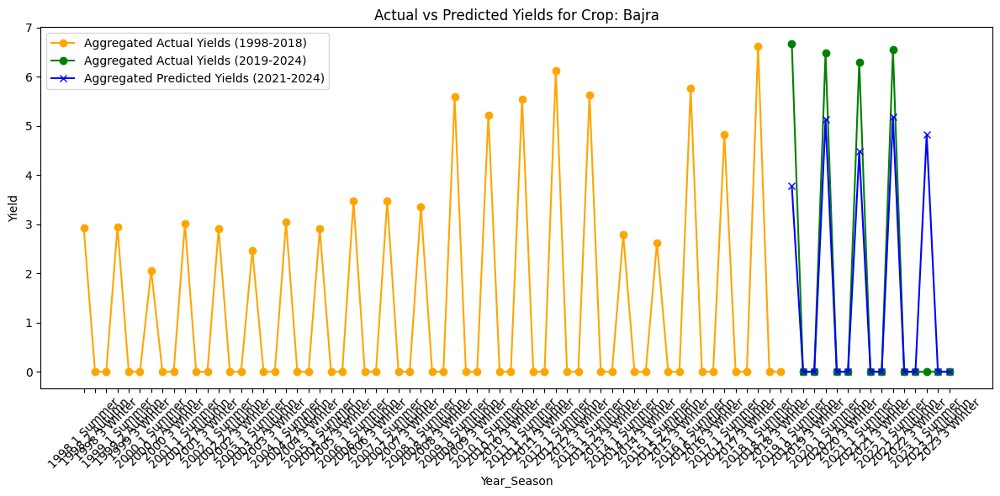

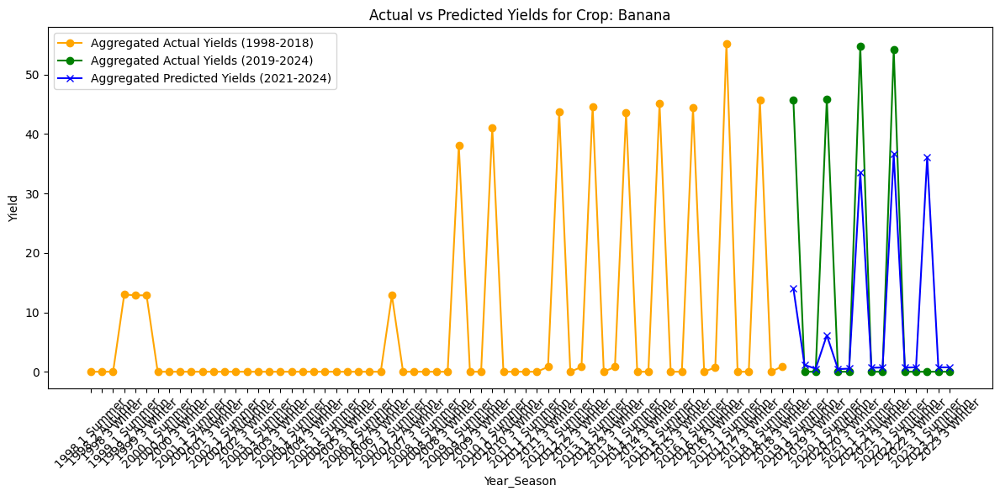

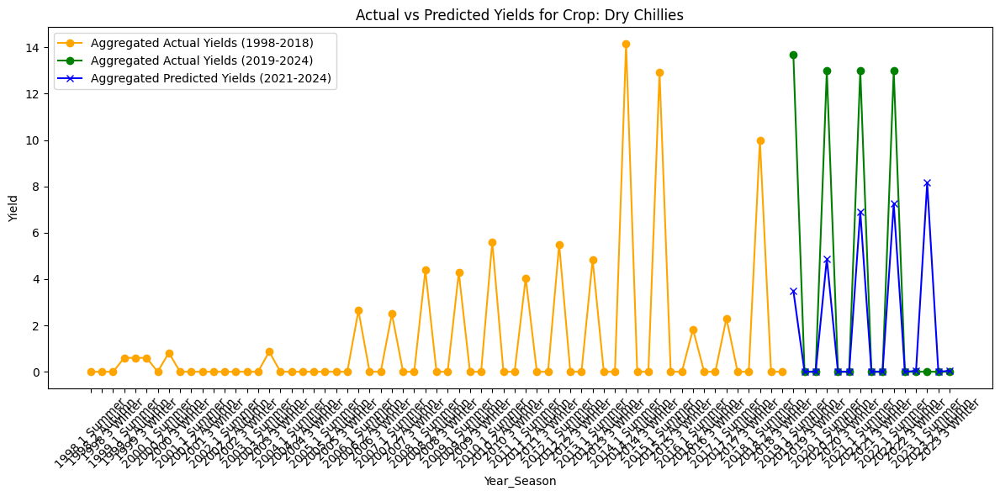

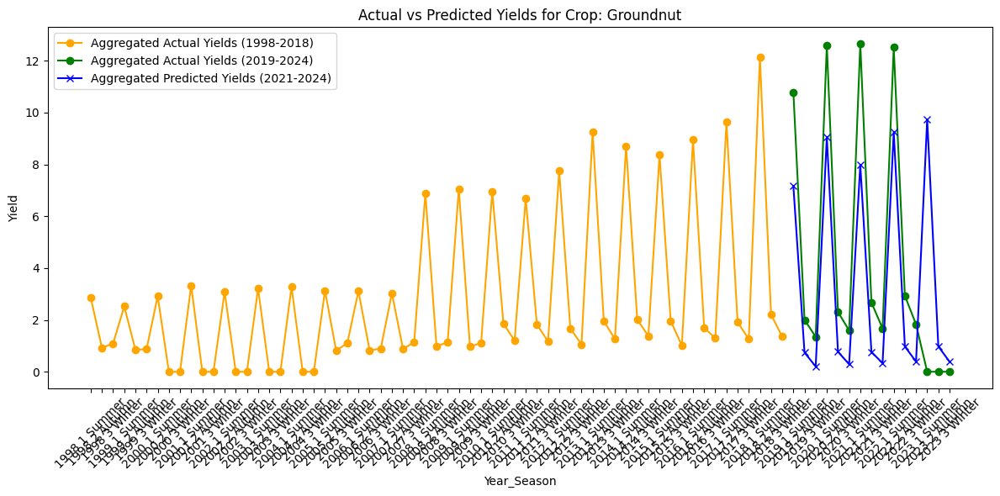

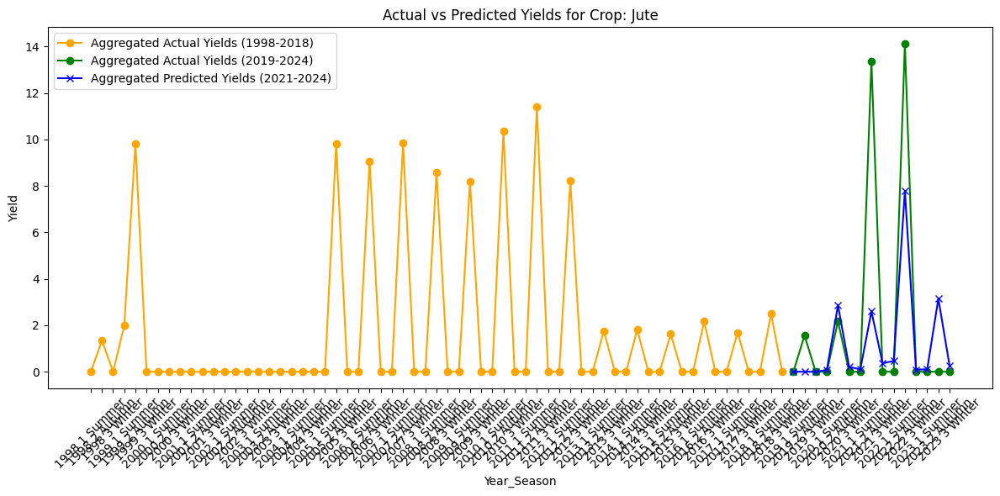

...

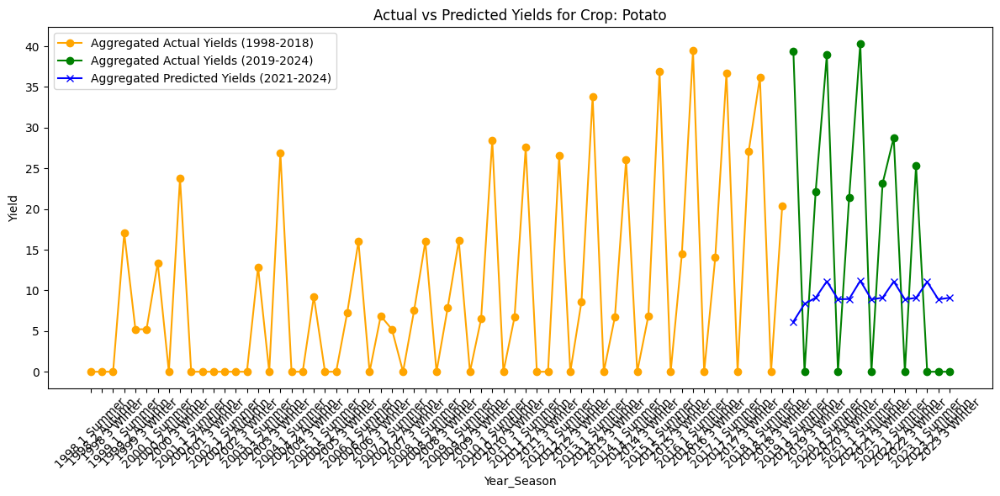

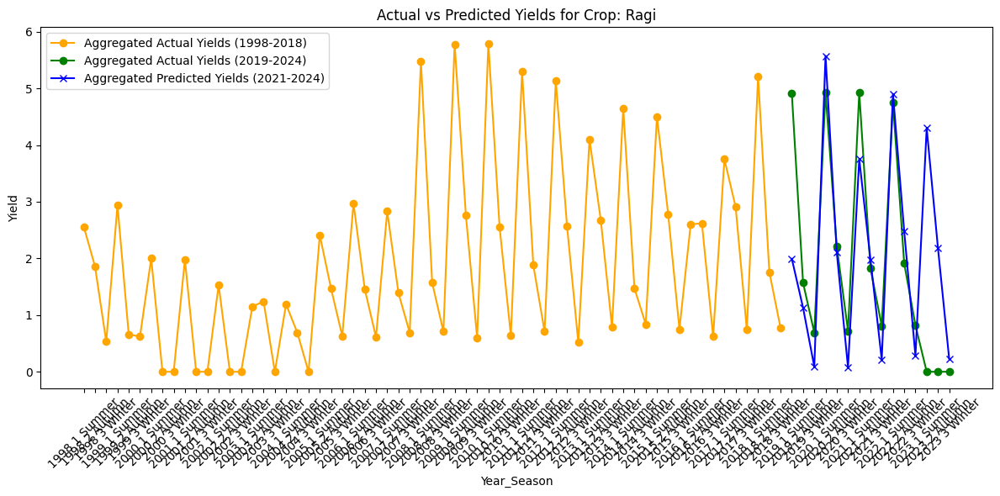

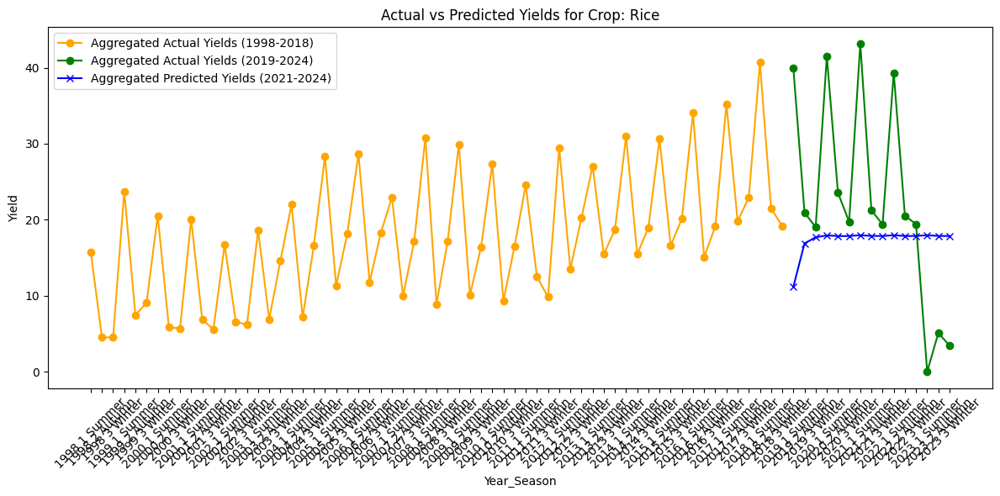

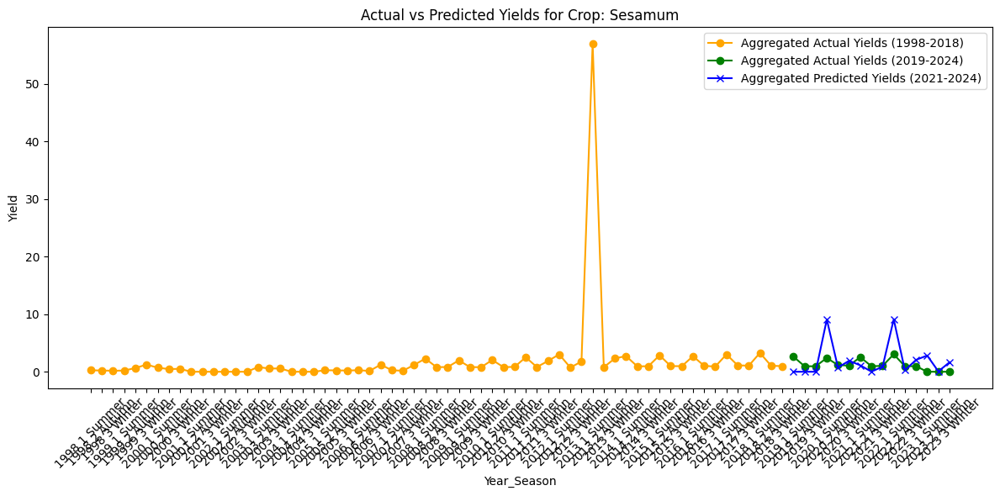

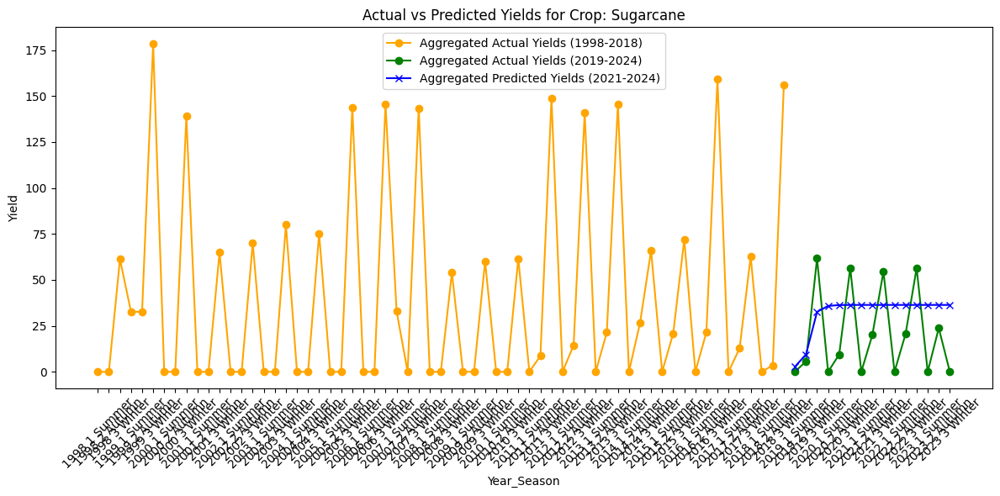

Average RMSE across all crops: 10.385137


In [76]:
# Best configuration: (32, 0.001, 0.3, 150)

# Optimised Paramaters
batch_size = 32        # Size of the batches for training
learning_rate = 0.001  # Learning rate for the optimizer
dropout_rate = 0.3   # Dropout rate (0.3 is typically a good start)
lstm_layer_size = 150  # Specify the number of LSTM units
num_layers = 2


class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_layer_size=100, output_size=1, dropout_rate=0.2, num_layers=2):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = nn.LSTM(input_size, hidden_layer_size, num_layers=num_layers, dropout=dropout_rate)
        self.linear = nn.Linear(hidden_layer_size, output_size)
        self.hidden_cell = (torch.zeros(num_layers, 1, self.hidden_layer_size),
                            torch.zeros(num_layers, 1, self.hidden_layer_size))

    def forward(self, input_seq):
        lstm_out, self.hidden_cell = self.lstm(input_seq.view(len(input_seq), 1, -1), self.hidden_cell)
        predictions = self.linear(lstm_out.view(len(input_seq), -1))
        return predictions

# Function to preprocess data
def preprocess_data(data, columns_to_encode):
    label_encoders = {}
    for column in columns_to_encode:
        if column not in label_encoders:
            label_encoders[column] = LabelEncoder()
        data[column] = label_encoders[column].fit_transform(data[column])
    numerical_data = data.select_dtypes(include=[np.number])
    scaler = StandardScaler()
    return torch.tensor(scaler.fit_transform(numerical_data.values)).float()

# Define the range of years for training and testing
train_years = list(range(1998, 2019))  # This includes 1998 to 2018
test_years = list(range(2019, 2025))   # This includes 2019 to 2024

# Define logic for splitting the grouped data into training and test sets
def split_data(data, train_years, test_years):
    # Create a copy of the data to avoid pandas warning
    data = data.copy()

    # Extract year and season from 'Year_Season'
    data['year_from_year_season'] = data['Year_Season'].apply(lambda x: int(x.split(' ')[0]))
    data['extracted_season'] = data['Year_Season'].apply(lambda x: x.split(' ')[-1])
    data['season_encoded'] = data['extracted_season'].apply(map_season)

    train_data = data[data['year_from_year_season'].isin(train_years)]
    test_data = data[data['year_from_year_season'].isin(test_years)]

    # Drop the temporary columns
    train_data = train_data.drop(columns=['year_from_year_season', 'extracted_season'])
    test_data = test_data.drop(columns=['year_from_year_season', 'extracted_season'])

    return train_data, test_data

# LSTM model training and predictions for each crop
crop_rmse_scores = {}
crop_actual_yields = {}
crop_predicted_yields = {}
crop_year_seasons = {}

# Initialize dictionaries for each crop before the loop
for crop in df_grouped['crop'].unique():
    crop_predicted_yields[crop] = []
    crop_actual_yields[crop] = []
    crop_year_seasons[crop] = []
    crop_rmse_scores[crop] = []

# Iterate over each crop and perform LSTM training and prediction
for crop in df_grouped['crop'].unique():
    crop_data = df_grouped[df_grouped['crop'] == crop]
    
    # Split crop_data into train and test sets using the updated split function
    train_data, test_data = split_data(crop_data, train_years, test_years)

    X_train = preprocess_data(train_data.drop(columns=['yield', 'Year_Season', 'crop']), ['season_encoded'])
    y_train = torch.tensor(train_data['yield'].values).float()
    X_test = preprocess_data(test_data.drop(columns=['yield', 'Year_Season', 'crop']), ['season_encoded'])
    y_test = torch.tensor(test_data['yield'].values).float()

    input_size = X_train.shape[1]  # Set input_size for the LSTM model
    model = LSTMModel(input_size=input_size, hidden_layer_size=lstm_layer_size, dropout_rate=dropout_rate, num_layers=num_layers)
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

    # Training Loop
    model.train()
    for epoch in range(150):  # Adjust number of epochs as needed
        for X_batch, y_batch in DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True):
            optimizer.zero_grad()
            # Reset hidden and cell states before each batch processing, considering num_layers
            model.hidden_cell = (torch.zeros(num_layers, 1, model.hidden_layer_size),
                                torch.zeros(num_layers, 1, model.hidden_layer_size))
            y_pred = model(X_batch)
            loss_function = nn.MSELoss()
            single_loss = loss_function(y_pred.view(-1, 1), y_batch.view(-1, 1))
            single_loss.backward()
            optimizer.step()

    # Evaluation Loop
    model.eval()
    predictions = []
    with torch.no_grad():
        for X_batch, _ in DataLoader(TensorDataset(X_test, y_test), batch_size=batch_size, shuffle=False):
            # Reset hidden and cell states before each batch processing, considering num_layers
            model.hidden_cell = (torch.zeros(num_layers, 1, model.hidden_layer_size),
                                torch.zeros(num_layers, 1, model.hidden_layer_size))
            
            y_pred_test = model(X_batch)
            predictions.extend(y_pred_test.view(-1).tolist())  # Flatten and collect all predictions


    predictions_tensor = torch.tensor(predictions).float()
    predictions_tensor = torch.clamp(predictions_tensor, min=0)  # Ensuring non-negative predictions

    # RMSE Calculation
    mse = mean_squared_error(y_test.numpy(), predictions_tensor.numpy())
    rmse = np.sqrt(mse)
    crop_rmse_scores[crop] = rmse

    # Storing results for plotting
    crop_predicted_yields[crop].extend(predictions_tensor.tolist())
    crop_actual_yields[crop].extend(y_test.tolist())
    crop_year_seasons[crop].extend(test_data['Year_Season'].tolist())

    print(f"RMSE for crop {crop}: {rmse}")

# Aggregate actual yield data for years 1998 to 2020 and 2021 to 2024
aggregated_actual_yields_1998_2018 = df_lstm[df_lstm['year'].between(1998, 2018)].groupby(['Year_Season', 'crop'])['yield'].sum().reset_index()
aggregated_actual_yields_2019_2024 = df_lstm[df_lstm['year'].between(2019, 2024)].groupby(['Year_Season', 'crop'])['yield'].sum().reset_index()

# Initialize dictionaries to store aggregated actual yields for plotting
aggregated_yields_for_plot_1998_2018 = {}
aggregated_yields_for_plot_2019_2024 = {}

for crop in df_grouped['crop'].unique():
    # Extract aggregated actual yield for each crop for the specified years
    crop_actual_yield_data_1998_2018 = aggregated_actual_yields_1998_2018[aggregated_actual_yields_1998_2018['crop'] == crop]
    aggregated_yields_for_plot_1998_2018[crop] = crop_actual_yield_data_1998_2018.groupby('Year_Season')['yield'].sum()
    
    crop_actual_yield_data_2019_2024 = aggregated_actual_yields_2019_2024[aggregated_actual_yields_2019_2024['crop'] == crop]
    aggregated_yields_for_plot_2019_2024[crop] = crop_actual_yield_data_2019_2024.groupby('Year_Season')['yield'].sum()

# Now, when plotting, include the actual aggregated yields for both periods
for crop in crop_rmse_scores.keys():
    plt.figure(figsize=(12, 6))
    if crop in aggregated_yields_for_plot_1998_2018:
        plt.plot(aggregated_yields_for_plot_1998_2018[crop].index, aggregated_yields_for_plot_1998_2018[crop].values, label='Aggregated Actual Yields (1998-2018)', color='orange', marker='o')
    if crop in aggregated_yields_for_plot_2019_2024:
        plt.plot(aggregated_yields_for_plot_2019_2024[crop].index, aggregated_yields_for_plot_2019_2024[crop].values, label='Aggregated Actual Yields (2019-2024)', color='green', marker='o')
    if crop in crop_predicted_yields:
        plt.plot(crop_year_seasons[crop], crop_predicted_yields[crop], label='Aggregated Predicted Yields (2021-2024)', color='blue', marker='x')
    plt.title(f'Actual vs Predicted Yields for Crop: {crop}')
    plt.xlabel('Year_Season')
    plt.ylabel('Yield')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()


# Calculate and output the average RMSE across all crops
average_rmse = np.mean(list(crop_rmse_scores.values()))
print("Average RMSE across all crops:", average_rmse)


Save Model State Dictionary After Training

In [77]:
# Save model and input size
torch.save({
    'model_state_dict': model.state_dict(),
    'input_size': X_train.shape[1]
}, 'model_weights.pth')
# Load the model and input size
checkpoint = torch.load('model_weights.pth')
print(f"Loaded model input size: {checkpoint['input_size']}")


Loaded model input size: 13


### Pre-processing Future Data

In [78]:
import pandas as pd
import numpy as np

# Load the forecasted future dataset
future_data = pd.read_csv('/Users/melvin/Desktop/bt4222/future_ywse_cleaned.csv')

# Check for duplicates and remove them
duplicate_rows = future_data[future_data.duplicated(subset=['crop', 'state', 'year', 'season'], keep=False)]
future_data.drop_duplicates(subset=['crop', 'state', 'year', 'season'], keep='first', inplace=True)

# Assume df is the existing DataFrame that contains historical data
all_crops = df['crop'].unique()
all_states = df['state'].unique()
all_seasons = df['season'].unique()
all_years = range(2024, 2029)  # Adjusted for years 2024 to 2028

# Generate all combinations of crops, states, years, and seasons
all_combinations = pd.DataFrame([(crop, state, year, season) for crop in all_crops for state in all_states for year in all_years for season in all_seasons],
                                columns=['crop', 'state', 'year', 'season'])

# Merge with the future data to ensure all combinations have data entries, filling missing entries with NaN
merged_df = pd.merge(all_combinations, future_data, on=['crop', 'state', 'year', 'season'], how='left')

# Replace missing values in other columns with the mean value for that column
columns_to_fill = merged_df.columns.difference(['crop', 'state', 'year', 'season'])
for column in columns_to_fill:
    mean_value = merged_df[column].mean()
    merged_df[column].fillna(mean_value, inplace=True)

# Filter rows for selected crops if necessary
selected_crops = ['Sesamum','Rice','Maize','Onion','Bajra','Groundnut','Dry Chillies','Potato','Ragi','Banana','Jute','Sugarcane']
merged_df = merged_df[merged_df['crop'].isin(selected_crops)]

# Prepare the final DataFrame for analysis
df_future = merged_df[['year', 'season', 'state', 'crop', 'temperature_2m_min', 'temperature_2m_max', 'precipitation_sum',
                       'rain_sum', 'Mean_N_SOIL', 'Mean_P_SOIL', 'Mean_K_SOIL', 'Mean_HUMIDITY', 'Mean_RAINFALL',
                       'Inflation annual %', 'Real GDP annual growth %', 'Population']]

def map_season(season):
    return '04-30' if season == 'Summer' else ('08-31' if season == 'Autumn' else '12-31')

df_future['Year_Season'] = df_future.apply(lambda row: str(row['year']) + '-' + map_season(row['season']), axis=1)
df_future = df_future.sort_values('Year_Season')
df_future['Year_Season'] = pd.to_datetime(df_future['Year_Season'], format='%Y-%m-%d').dt.floor('D')
df_future.reset_index(drop=True, inplace=True)
df_future = df_future.drop(columns=['year', 'season'])
df_future.head()
#df_future.shape()
#df_future.to_csv('df_future.csv', index=False)

/var/folders/y0/0b_29ywn0sd8471fpn4trq3h0000gn/T/ipykernel_81830/3847822232.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_df[column].fillna(mean_value, inplace=True)
/var/folders/y0/0b_29ywn0sd8471fpn4trq3h0000gn/T/ipykernel_81830/3847822232.py:42: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-

,state,crop,temperature_2m_min,temperature_2m_max,precipitation_sum,rain_sum,Mean_N_SOIL,Mean_P_SOIL,Mean_K_SOIL,Mean_HUMIDITY,Mean_RAINFALL,Inflation annual %,Real GDP annual growth %,Population,Year_Season
0,Andaman and Nicobar Islands,Sesamum,27.157944,29.362617,9.229533,0.000000,81.466667,50.133333,40.333333,81.890278,240.609670,4.550,6.29,1.441720e+09,2024-04-30
1,Karnataka,Groundnut,23.214019,32.342056,3.710981,0.000000,21.083333,67.777778,20.083333,27.944109,112.706080,4.550,6.29,1.441720e+09,2024-04-30
2,Madhya Pradesh,Sugarcane,19.883460,28.647373,4.103193,0.088333,60.308823,46.045967,35.421113,72.116802,121.397394,4.146,6.31,1.466962e+09,2024-04-30
3,Mizoram,Sesamum,19.883460,28.647373,4.103193,0.088333,60.308823,46.045967,35.421113,72.116802,121.397394,4.146,6.31,1.466962e+09,2024-04-30
4,Madhya Pradesh,Groundnut,19.645238,30.397619,2.717262,0.000000,32.295455,56.659091,19.409091,73.700232,59.522094,4.550,6.29,1.441720e+09,2024-04-30


### Forecasting Future Crop Yield on National level from 2024 - 2028

/var/folders/y0/0b_29ywn0sd8471fpn4trq3h0000gn/T/ipykernel_81830/3938638883.py:72: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  for X_batch in DataLoader(torch.tensor(X_future).float(), batch_size=32):


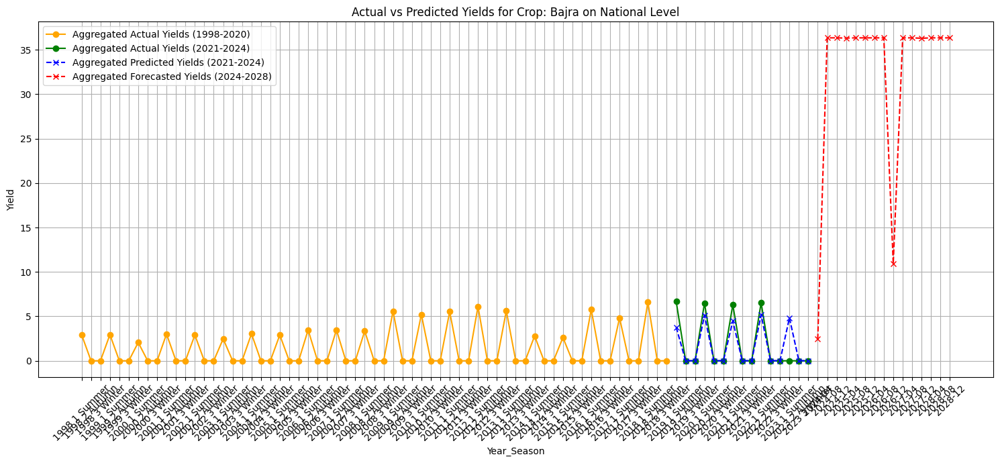

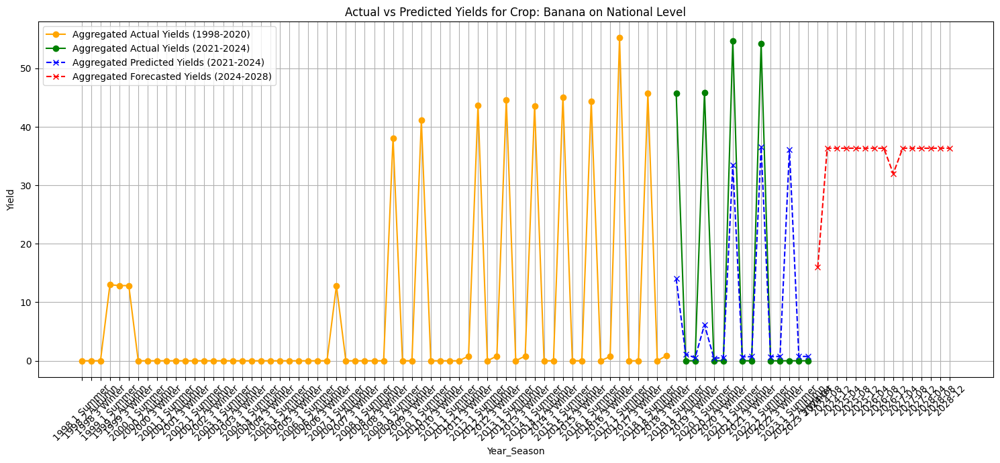

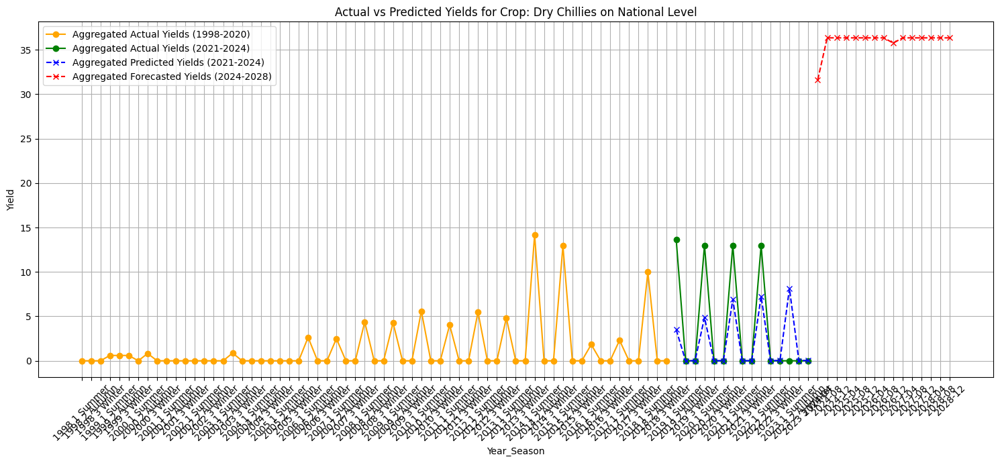

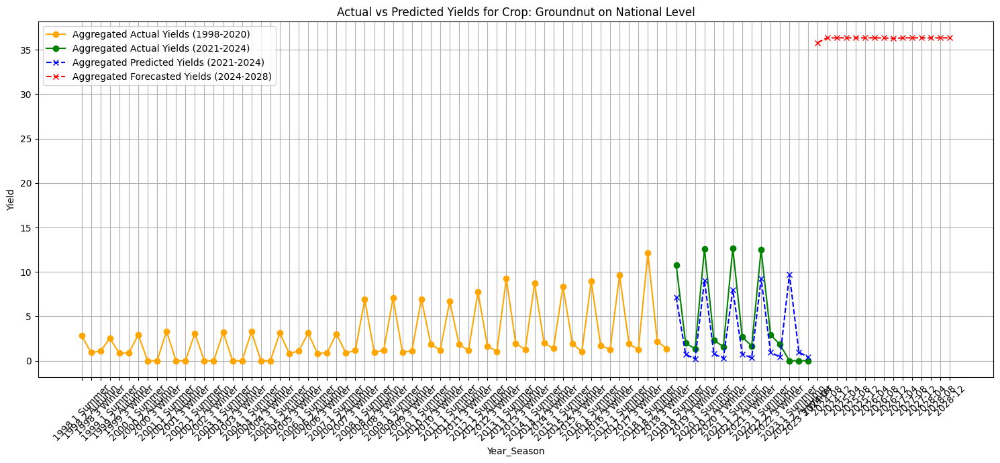

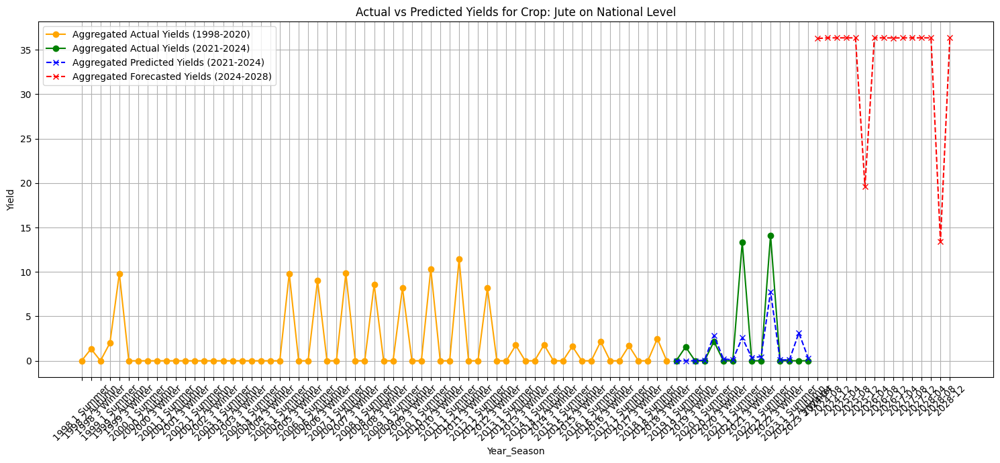

...

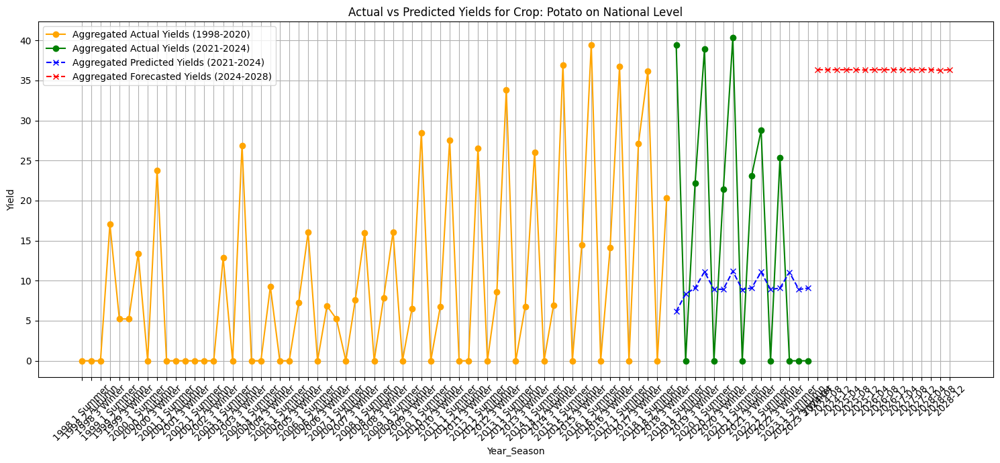

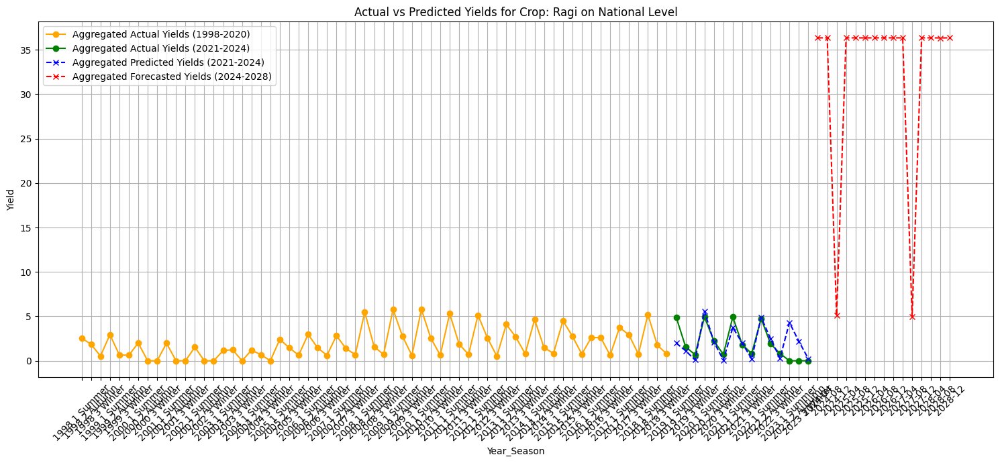

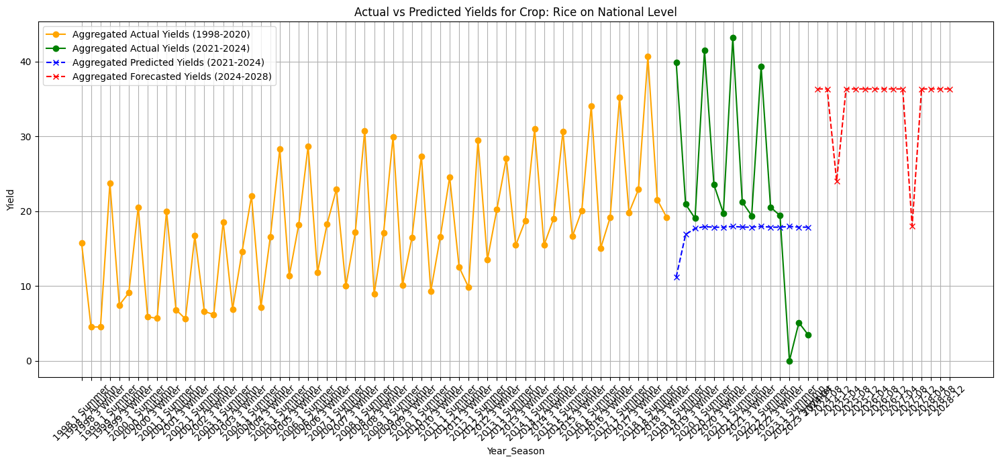

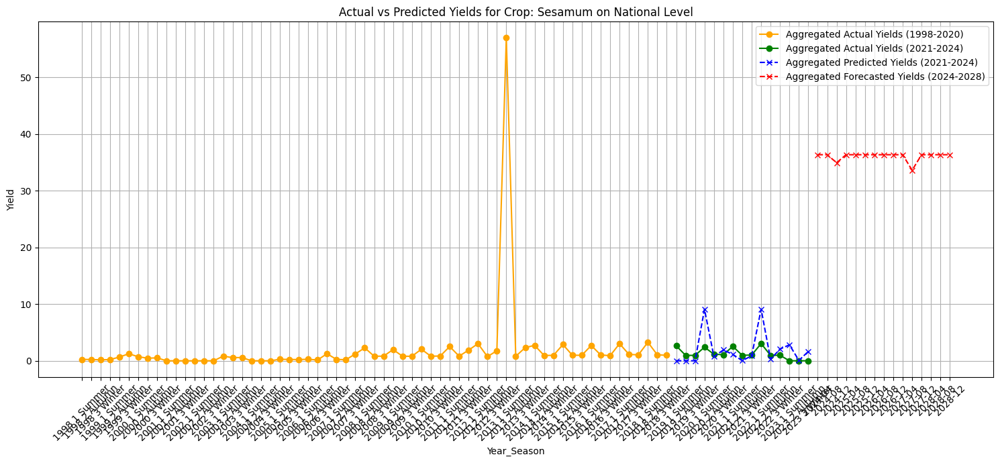

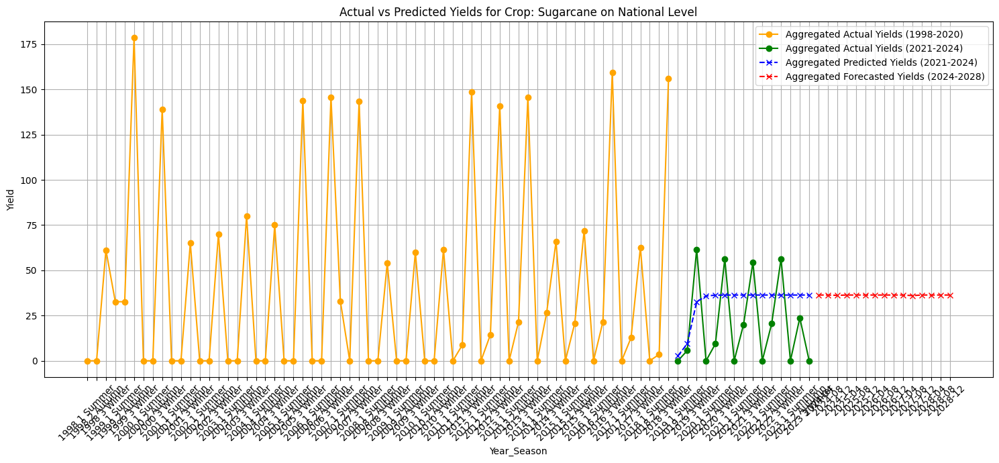

In [79]:
# Map months to seasons, assuming 'Year_Season' is already in datetime format
def map_month_to_season(month):
    if month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Autumn'
    else:
        return 'Winter'

# Define the map_season function
def map_season(season):
    return {'Spring': 1, 'Summer': 2, 'Autumn': 3, 'Winter': 4}[season]

# Define a reverse mapping from season encoded to season name
def decode_season(encoded):
    season_map = {1: 'Spring', 2: 'Summer', 3: 'Autumn', 4: 'Winter'}
    return season_map.get(encoded, 'Unknown')  # 'Unknown' as a fallback

# Function to preprocess data
def preprocess_data(data, columns_to_encode):
    label_encoders = {}
    for column in columns_to_encode:
        if column not in label_encoders:
            label_encoders[column] = LabelEncoder()
        data[column] = label_encoders[column].fit_transform(data[column])
    numerical_data = data.select_dtypes(include=[np.number])
    scaler = StandardScaler()
    return torch.tensor(scaler.fit_transform(numerical_data.values)).float()

# Extract year and season from 'Year_Season'
df_future['year_from_year_season'] = df_future['Year_Season'].dt.year
df_future['extracted_season'] = df_future['Year_Season'].dt.month.apply(map_month_to_season)
df_future['season_encoded'] = df_future['extracted_season'].apply(map_season)

# Drop columns that won't be used for prediction
df_future = df_future.drop(columns=['year_from_year_season', 'extracted_season'])

df_future_grouped = df_future.groupby(['Year_Season', 'crop']).agg({
    'temperature_2m_min': 'mean',
    'temperature_2m_max': 'mean',
    'precipitation_sum': 'mean',
    'rain_sum': 'mean',
    'Mean_N_SOIL': 'mean',
    'Mean_P_SOIL': 'mean',
    'Mean_K_SOIL': 'mean',
    'Mean_HUMIDITY': 'mean',
    'Mean_RAINFALL': 'mean',
    'Inflation annual %': 'mean',
    'Real GDP annual growth %': 'mean',
    'Population': 'mean',
    'season_encoded': 'mean'  # Assuming season changes are not frequent within the same grouping
}).reset_index()

# Rounding the season_encoded to the nearest integer
df_future_grouped['season_encoded'] = df_future_grouped['season_encoded'].round().astype(int)
df_future_grouped['season_name'] = df_future_grouped['season_encoded'].apply(decode_season)


X_future = preprocess_data(df_future_grouped.drop(columns=['Year_Season', 'crop']), [])
# Load the metadata along with the state dict
checkpoint = torch.load('model_weights.pth')
input_size = checkpoint['input_size']
model = LSTMModel(input_size=input_size, hidden_layer_size=150, dropout_rate=0.3, num_layers=2)
model.load_state_dict(checkpoint['model_state_dict'])

# Generate predictions
model.eval()
future_predictions = []
with torch.no_grad():
    for X_batch in DataLoader(torch.tensor(X_future).float(), batch_size=32):
        model.hidden_cell = (torch.zeros(2, 1, 150), torch.zeros(2, 1, 150))  # Reset hidden state
        predictions = model(X_batch)
        future_predictions.extend(predictions.view(-1).tolist())

# Add predictions to df_future for plotting
df_future_grouped['predicted_yield'] = future_predictions

# Group by 'Year_Season' and 'crop', then sum 'yield'
aggregated_data = df_future_grouped.groupby(['Year_Season', 'crop'])['predicted_yield'].sum().reset_index()

# Consolidate all plots into a single loop per crop
for crop in crop_rmse_scores.keys():
    plt.figure(figsize=(15, 7))  # Larger figure size for clarity

    # Historical data plotting
    if crop in aggregated_yields_for_plot_1998_2018:
        plt.plot(aggregated_yields_for_plot_1998_2018[crop].index, aggregated_yields_for_plot_1998_2018[crop].values, label='Aggregated Actual Yields (1998-2020)', color='orange', marker='o', linestyle='-')

    if crop in aggregated_yields_for_plot_2019_2024:
        plt.plot(aggregated_yields_for_plot_2019_2024[crop].index, aggregated_yields_for_plot_2019_2024[crop].values, label='Aggregated Actual Yields (2021-2024)', color='green', marker='o', linestyle='-')

    if crop in crop_predicted_yields:
        plt.plot(crop_year_seasons[crop], crop_predicted_yields[crop], label='Aggregated Predicted Yields (2021-2024)', color='blue', marker='x', linestyle='--')

    # Future predictions plotting
    aggregated_crop_data = aggregated_data[aggregated_data['crop'] == crop]
    if not aggregated_crop_data.empty:
        plt.plot(aggregated_crop_data['Year_Season'].dt.strftime('%Y-%m'), aggregated_crop_data['predicted_yield'], label='Aggregated Forecasted Yields (2024-2028)', color='red', marker='x', linestyle='--')
            
    plt.title(f'Actual vs Predicted Yields for Crop: {crop} on National Level')
    plt.xlabel('Year_Season')
    plt.ylabel('Yield')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)  # Optionally add grid for better readability
    plt.tight_layout()
    plt.show()

### HyperParameter Tuning for National Level Model

In [75]:
# Possible values for hyperparameter tuning
batch_sizes = [32, 64]
learning_rates = [0.0001, 0.001]
dropout_rates = [0.2, 0.3, 0.4]
lstm_layer_sizes = [50, 100, 150]
num_layers = 2

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_layer_size=100, output_size=1, dropout_rate=0.2, num_layers=2):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = nn.LSTM(input_size, hidden_layer_size, num_layers=num_layers, dropout=dropout_rate)
        self.linear = nn.Linear(hidden_layer_size, output_size)
        self.hidden_cell = (torch.zeros(num_layers, 1, self.hidden_layer_size),
                            torch.zeros(num_layers, 1, self.hidden_layer_size))

    def forward(self, input_seq):
        lstm_out, self.hidden_cell = self.lstm(input_seq.view(len(input_seq), 1, -1), self.hidden_cell)
        predictions = self.linear(lstm_out.view(len(input_seq), -1))
        return predictions

# Initialize results storage
results = []

# Hyperparameter tuning nested loops
for batch_size in batch_sizes:
    for learning_rate in learning_rates:
        for dropout_rate in dropout_rates:
            for lstm_layer_size in lstm_layer_sizes:
                print(f"Training with batch size {batch_size}, learning rate {learning_rate}, "
                      f"dropout rate {dropout_rate}, LSTM layer size {lstm_layer_size}")

                # Iterate over each crop and perform LSTM training and prediction
                crop_rmse_scores = {}

                for crop in df_grouped['crop'].unique():
                    crop_data = df_grouped[df_grouped['crop'] == crop]
                    train_data, test_data = split_data(crop_data, train_years, test_years)
                    X_train = preprocess_data(train_data.drop(columns=['yield', 'Year_Season', 'crop']), ['season_encoded'])
                    y_train = torch.tensor(train_data['yield'].values).float()
                    X_test = preprocess_data(test_data.drop(columns=['yield', 'Year_Season', 'crop']), ['season_encoded'])
                    y_test = torch.tensor(test_data['yield'].values).float()

                    input_size = X_train.shape[1]  # Set input_size for the LSTM model
                    model = LSTMModel(input_size=input_size, hidden_layer_size=lstm_layer_size, dropout_rate=dropout_rate, num_layers=num_layers)
                    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

                    # Training Loop
                    model.train()
                    for epoch in range(150):  # Adjust number of epochs as needed
                        for X_batch, y_batch in DataLoader(TensorDataset(X_train, y_train), batch_size=batch_size, shuffle=True):
                            optimizer.zero_grad()
                            model.hidden_cell = (torch.zeros(num_layers, 1, model.hidden_layer_size),
                                                 torch.zeros(num_layers, 1, model.hidden_layer_size))
                            y_pred = model(X_batch)
                            loss_function = nn.MSELoss()
                            loss = loss_function(y_pred.view(-1, 1), y_batch.view(-1, 1))
                            loss.backward()
                            optimizer.step()

                    # Evaluation Loop
                    model.eval()
                    predictions = []
                    with torch.no_grad():
                        for X_batch, _ in DataLoader(TensorDataset(X_test, y_test), batch_size=batch_size, shuffle=False):
                            model.hidden_cell = (torch.zeros(num_layers, 1, model.hidden_layer_size),
                                                 torch.zeros(num_layers, 1, model.hidden_layer_size))
                            y_pred_test = model(X_batch)
                            predictions.extend(y_pred_test.view(-1).tolist())

                    predictions_tensor = torch.tensor(predictions).float()
                    predictions_tensor = torch.clamp(predictions_tensor, min=0)  # Ensuring non-negative predictions

                    mse = mean_squared_error(y_test.numpy(), predictions_tensor.numpy())
                    rmse = np.sqrt(mse)
                    crop_rmse_scores[crop] = rmse

                average_rmse = np.mean(list(crop_rmse_scores.values()))
                results.append((batch_size, learning_rate, dropout_rate, lstm_layer_size, average_rmse))
                print(f"Average RMSE for configuration: {average_rmse}")

# Find the best configuration
best_config = min(results, key=lambda x: x[4])
print("Best configuration:", best_config)


Training with batch size 32, learning rate 0.0001, dropout rate 0.2, LSTM layer size 50
Average RMSE for configuration: 13.728134155273438
Training with batch size 32, learning rate 0.0001, dropout rate 0.2, LSTM layer size 100
Average RMSE for configuration: 13.081058502197266
Training with batch size 32, learning rate 0.0001, dropout rate 0.2, LSTM layer size 150
Average RMSE for configuration: 12.603408813476562
Training with batch size 32, learning rate 0.0001, dropout rate 0.3, LSTM layer size 50
Average RMSE for configuration: 13.77340316772461
Training with batch size 32, learning rate 0.0001, dropout rate 0.3, LSTM layer size 100
Average RMSE for configuration: 13.025505065917969
Training with batch size 32, learning rate 0.0001, dropout rate 0.3, LSTM layer size 150
Average RMSE for configuration: 12.637481689453125
Training with batch size 32, learning rate 0.0001, dropout rate 0.4, LSTM layer size 50
Average RMSE for configuration: 13.791141510009766
Training with batch size

### Training and Testing of LSTM model on each Crop for each State

In [69]:
# Baseline LSTM model
class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_layer_size=100, output_size=1):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = nn.LSTM(input_size, hidden_layer_size)
        self.linear = nn.Linear(hidden_layer_size, output_size)
        self.hidden_cell = (torch.zeros(1,1,self.hidden_layer_size),
                            torch.zeros(1,1,self.hidden_layer_size))

    def forward(self, input_seq):
        lstm_out, self.hidden_cell = self.lstm(input_seq.view(len(input_seq), 1, -1), self.hidden_cell)
        predictions = self.linear(lstm_out.view(len(input_seq), -1))
        return predictions[-1]

# LSTM model training and predictions for each crop
crop_rmse_scores = {}
crop_actual_yields = {}
crop_predicted_yields = {}
crop_year_seasons = {}

# Initialize dictionaries for each crop before the loop
for crop in df_grouped['crop'].unique():
    crop_predicted_yields[crop] = []
    crop_actual_yields[crop] = []
    crop_year_seasons[crop] = []
    crop_rmse_scores[crop] = []

selected_crops = ['Rice', 'Maize', 'Sugarcane', 'Potato', 'Onion']

# Finding states that produce selected crops
states_for_selected_crops = {}
for crop in selected_crops:
    states_for_selected_crops[crop] = df_lstm[df_lstm['crop'] == crop]['state'].unique()

# Initialize state level forecasts dictionary for the selected crops
state_level_forecasts = {crop: {} for crop in selected_crops}

for crop in selected_crops:
    for state in states_for_selected_crops[crop]:
        state_crop_data = df_lstm[(df_lstm['crop'] == crop) & (df_lstm['state'] == state)]

        # Split into training and testing sets
        train_data, test_data = split_data(state_crop_data, train_years, test_years)

        # Check if data is available
        if not train_data.empty and not test_data.empty:
            # Preprocess the data
            X_train = preprocess_data(train_data.drop(columns=['yield', 'Year_Season', 'crop', 'state']), ['season'])
            y_train = torch.tensor(train_data['yield'].values).float()
            X_test = preprocess_data(test_data.drop(columns=['yield', 'Year_Season', 'crop', 'state']), ['season'])
            y_test = torch.tensor(test_data['yield'].values).float()
        
        # Train the LSTM model for each state and crop
        model = LSTMModel(input_size=X_train.shape[1])
        optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

        # Training Loop
        model.train()
        for epoch in range(150):  # Adjust number of epochs as needed
            for X_batch, y_batch in DataLoader(TensorDataset(X_train, y_train), batch_size=1, shuffle=True):
                optimizer.zero_grad()
                model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
                                    torch.zeros(1, 1, model.hidden_layer_size))
                
                y_pred = model(X_batch)
                # Ensure that both y_pred and y_batch are 2D tensors with the same shape
                loss_function = nn.MSELoss()
                single_loss = loss_function(y_pred.view(-1, 1), y_batch.view(-1, 1))
                single_loss.backward()
                optimizer.step()

        # Evaluation Loop
        model.eval()
        predictions = []
        with torch.no_grad():
            for X_batch, y_batch in DataLoader(TensorDataset(X_test, y_test), batch_size=1, shuffle=False):
                model.hidden_cell = (torch.zeros(1, 1, model.hidden_layer_size),
                                    torch.zeros(1, 1, model.hidden_layer_size))
                y_pred_test = model(X_batch)
                predictions.append(y_pred_test.item())

        predictions_tensor = torch.tensor(predictions).float()
        predictions_tensor = torch.clamp(predictions_tensor, min=0)  # Ensuring non-negative predictions

        # RMSE Calculation
        mse = mean_squared_error(y_test, predictions_tensor)
        rmse = np.sqrt(mse)
        crop_rmse_scores[crop] = rmse

        # Store predictions
        state_level_forecasts[crop][state] = {
            'predictions': predictions,
            'actuals': y_test.tolist()
        }

national_level_forecasts = {}

for crop in selected_crops:  # Iterate only over selected crops
    national_predictions = []
    national_actuals = []

    for state in states_for_selected_crops[crop]:  # Iterate over states relevant to the crop
        if state in state_level_forecasts[crop]:
            national_predictions.extend(state_level_forecasts[crop][state]['predictions'])
            national_actuals.extend(state_level_forecasts[crop][state]['actuals'])

    national_level_forecasts[crop] = {
        'national_predictions': sum(national_predictions),
        'national_actuals': sum(national_actuals)
    }

# Aggregate actual yield data for test years (2021-2024)
aggregated_actual_yields_test = df_lstm[df_lstm['year'].between(2021, 2024)].groupby(['crop'])['yield'].sum()

# Create a dictionary to store ground truth values
ground_truth_national_yields = aggregated_actual_yields_test.to_dict()


### State-Level Predictions Plot

In [70]:
state_level_rmse = {}

for crop in selected_crops:
    state_level_rmse[crop] = {}
    for state in states_for_selected_crops[crop]:
        if state in state_level_forecasts[crop]:
            actuals = state_level_forecasts[crop][state]['actuals']
            predictions = state_level_forecasts[crop][state]['predictions']
            rmse = np.sqrt(mean_squared_error(actuals, predictions))
            state_level_rmse[crop][state] = rmse
            print(f"RMSE for {crop} in {state}: {rmse}")

RMSE for Rice in Meghalaya: 1.9535710556279613
RMSE for Rice in Odisha: 1.4558008096242658
RMSE for Rice in Puducherry: 1.7729859454113213
RMSE for Rice in Manipur: 0.5903067197844908
RMSE for Rice in West Bengal: 1.3803144022630631
RMSE for Rice in Assam: 1.202564644609932
RMSE for Rice in Bihar: 1.2218775814182379
RMSE for Rice in Jharkhand: 3.480257949577261
RMSE for Rice in Karnataka: 1.0285064868867562
RMSE for Rice in Kerala: 1.61163549828318
RMSE for Rice in Andaman and Nicobar Islands: 0.9560428461839912
RMSE for Rice in Gujarat: 0.9410173478779712
RMSE for Rice in Madhya Pradesh: 1.2817276641847108
RMSE for Rice in Tamil Nadu: 3.9505177222755496
RMSE for Rice in Tripura: 3.0318738751575594
RMSE for Rice in Uttar Pradesh: 0.9188545908532476
RMSE for Rice in Uttarakhand: 1.3600470239486935
RMSE for Rice in Mizoram: 0.41596249305970834
RMSE for Maize in Bihar: 1.7367121792545261
RMSE for Maize in Jharkhand: 0.672544788529955
RMSE for Maize in Karnataka: 0.9820671290214429
RMSE fo

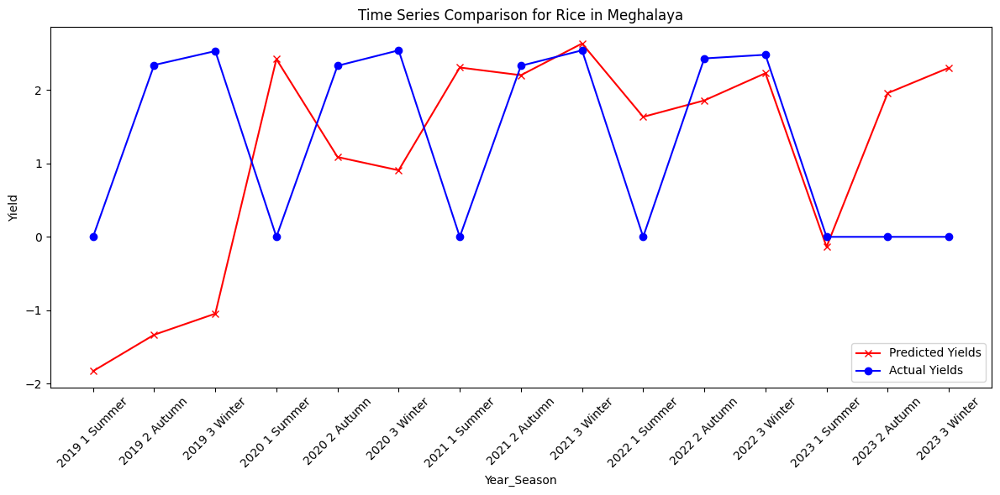

RMSE for Rice in Meghalaya: 1.9535710556279613


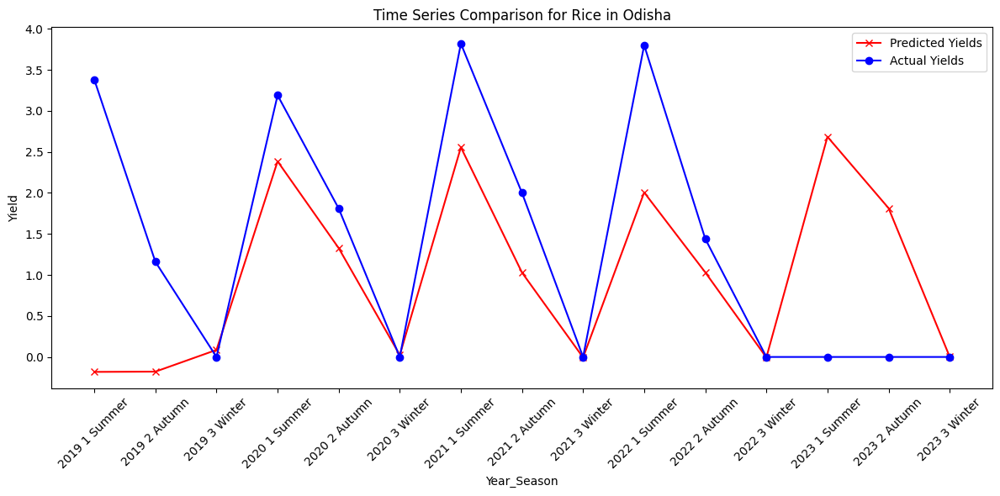

RMSE for Rice in Odisha: 1.4558008096242658


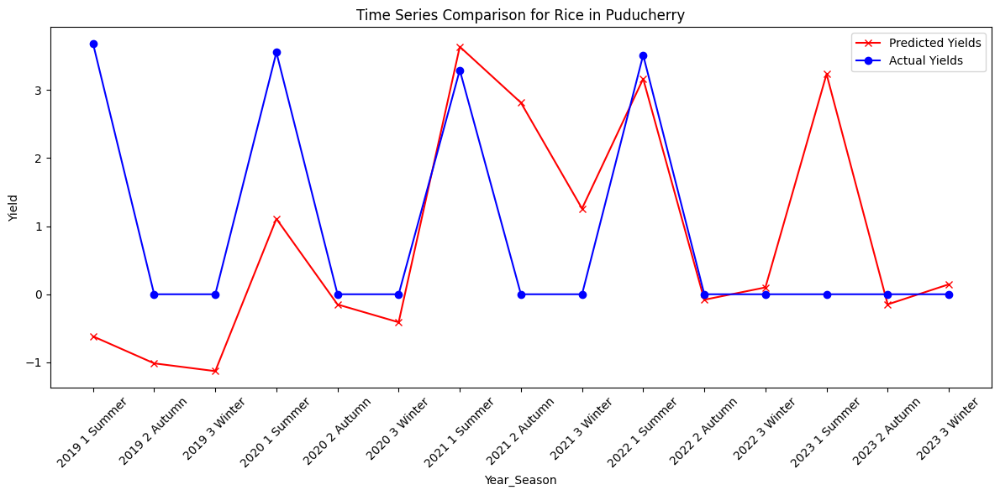

RMSE for Rice in Puducherry: 1.7729859454113213


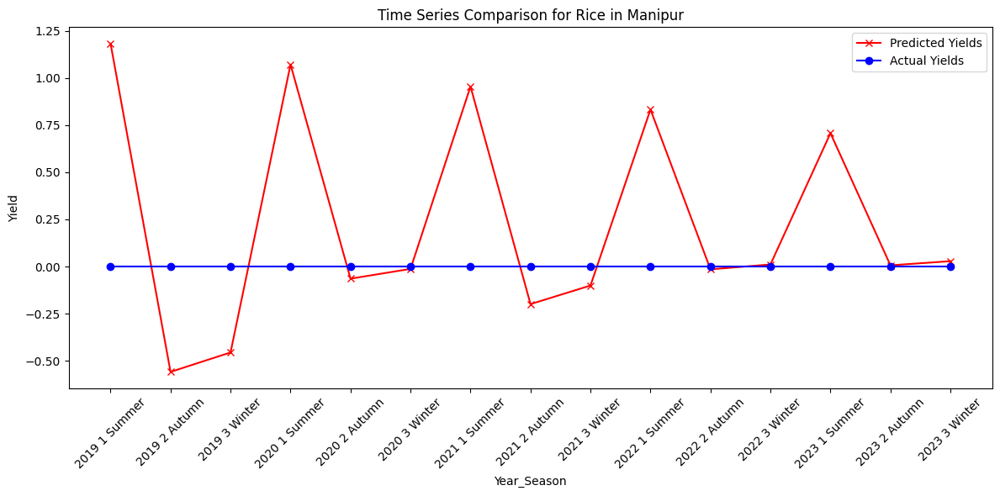

RMSE for Rice in Manipur: 0.5903067197844908


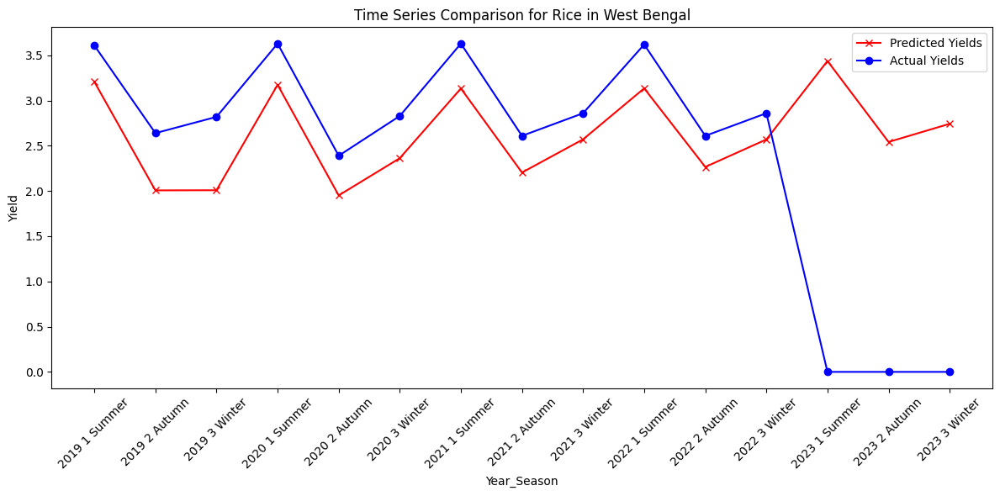

RMSE for Rice in West Bengal: 1.3803144022630631


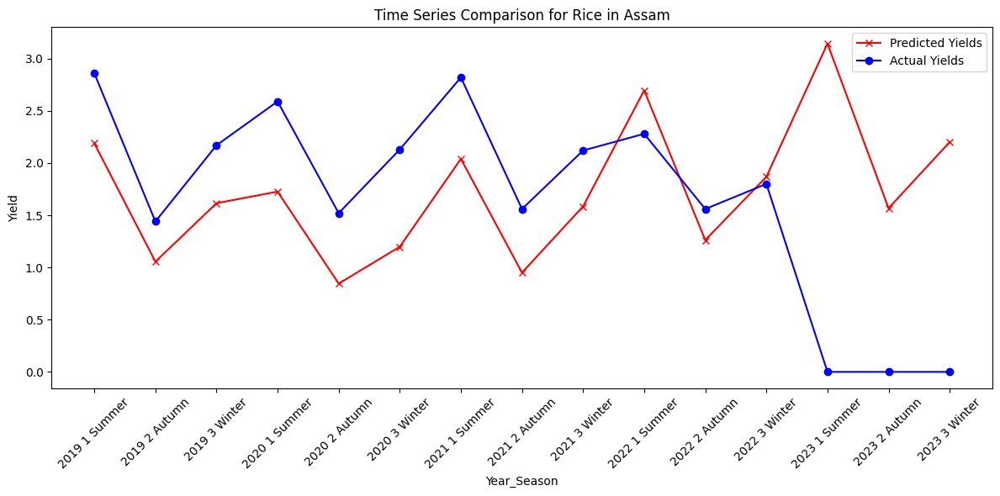

RMSE for Rice in Assam: 1.202564644609932


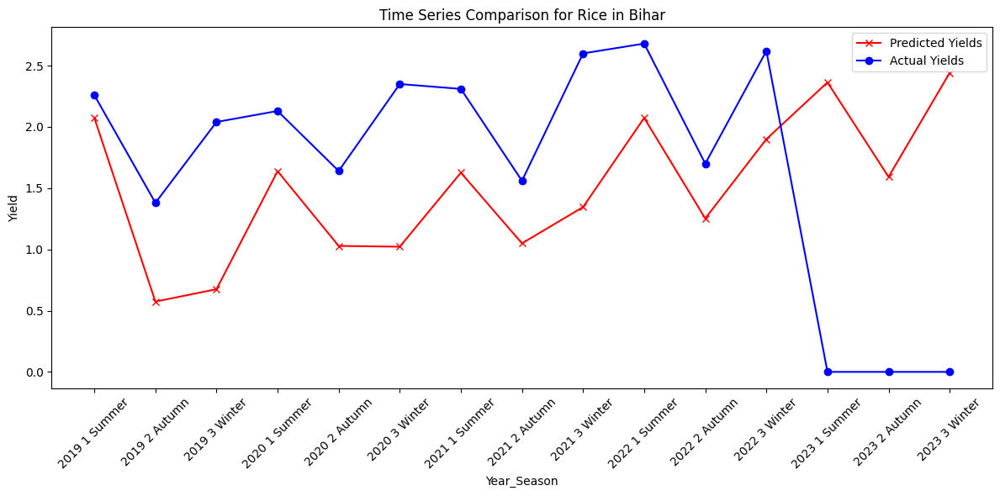

RMSE for Rice in Bihar: 1.2218775814182379


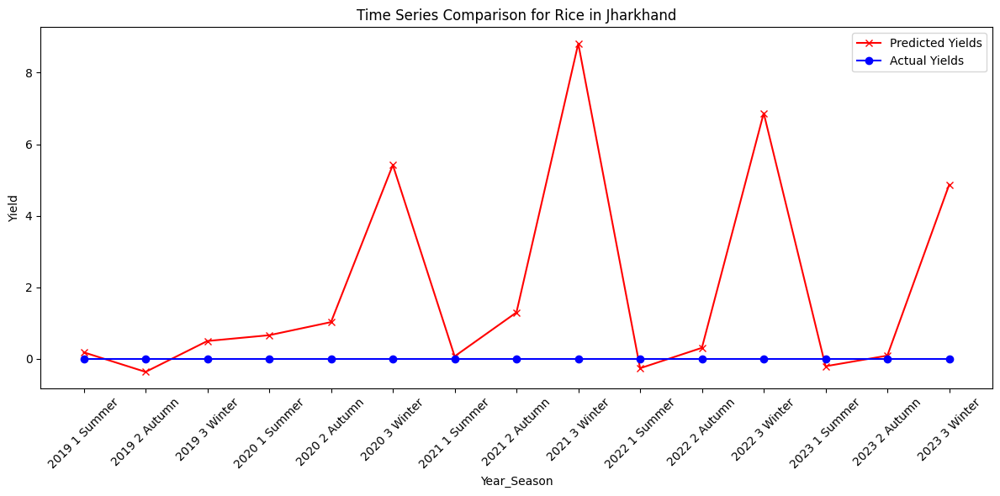

RMSE for Rice in Jharkhand: 3.480257949577261


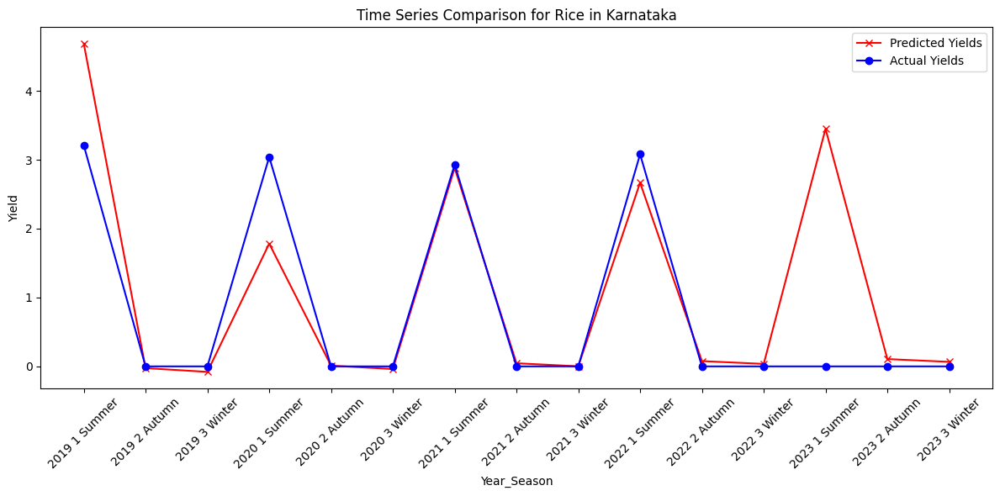

RMSE for Rice in Karnataka: 1.0285064868867562


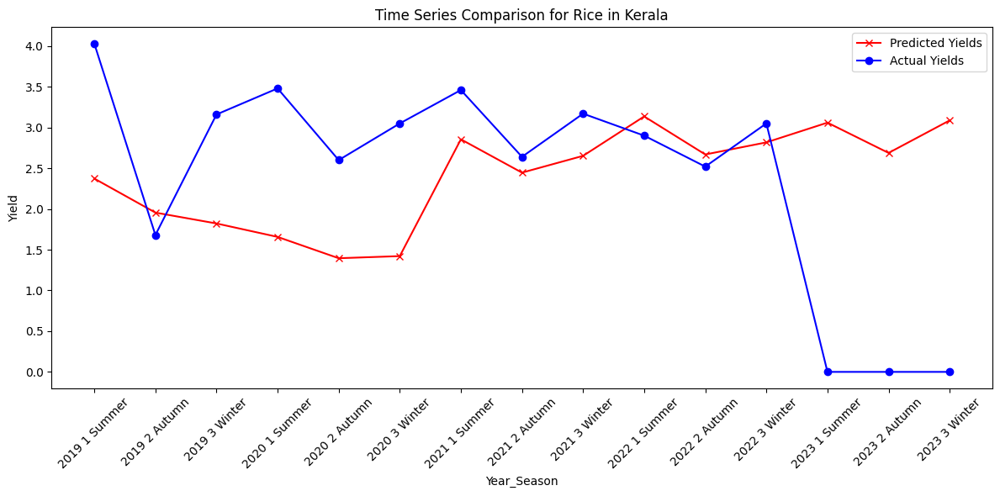

RMSE for Rice in Kerala: 1.61163549828318


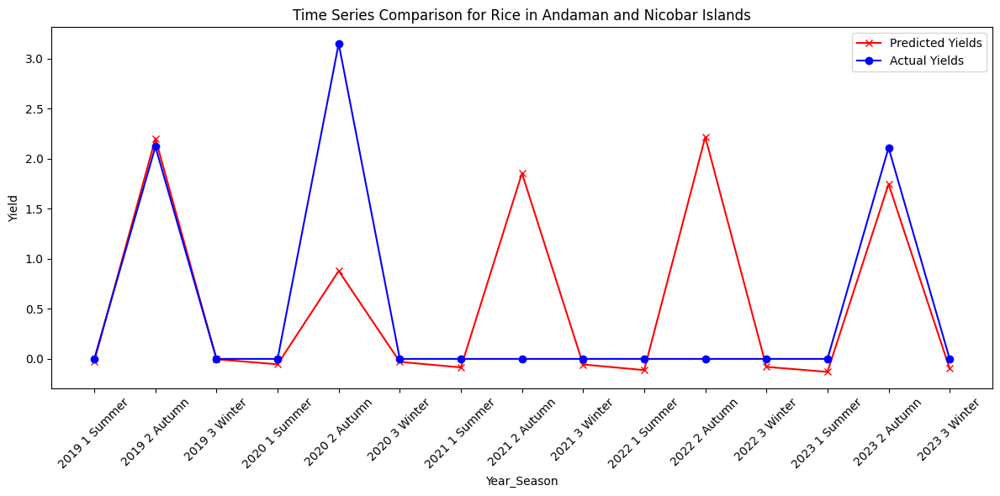

RMSE for Rice in Andaman and Nicobar Islands: 0.9560428461839912


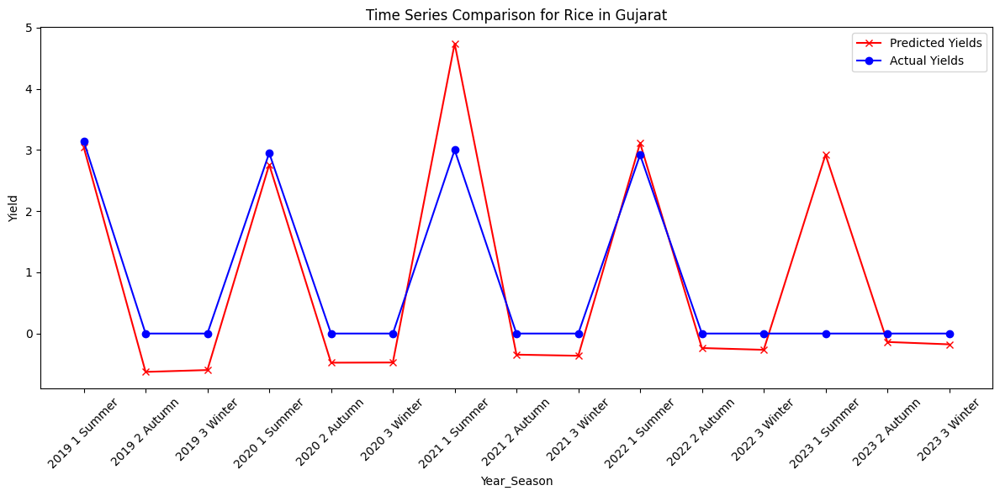

RMSE for Rice in Gujarat: 0.9410173478779712


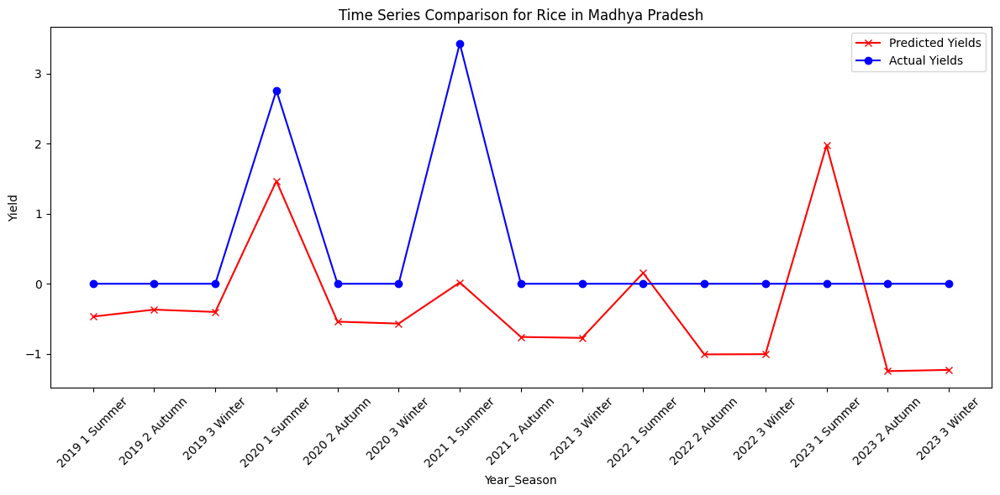

RMSE for Rice in Madhya Pradesh: 1.2817276641847108


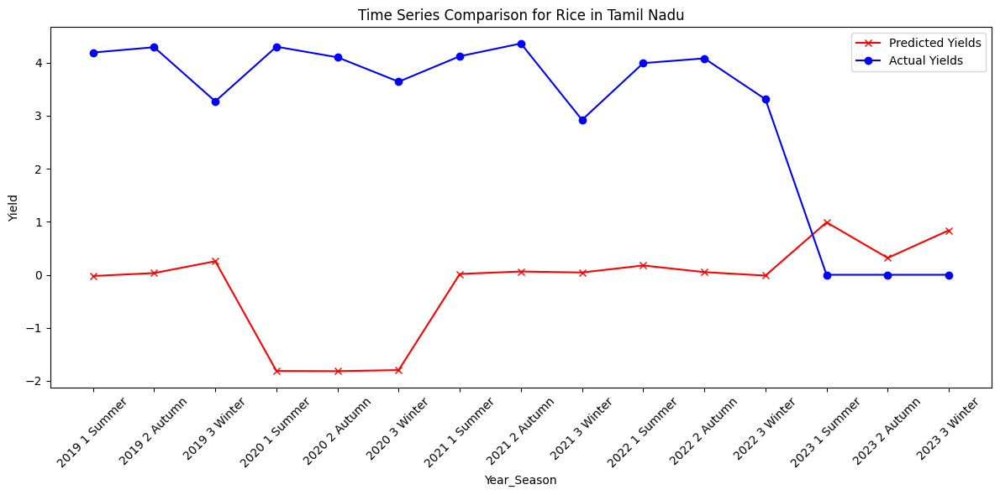

RMSE for Rice in Tamil Nadu: 3.9505177222755496


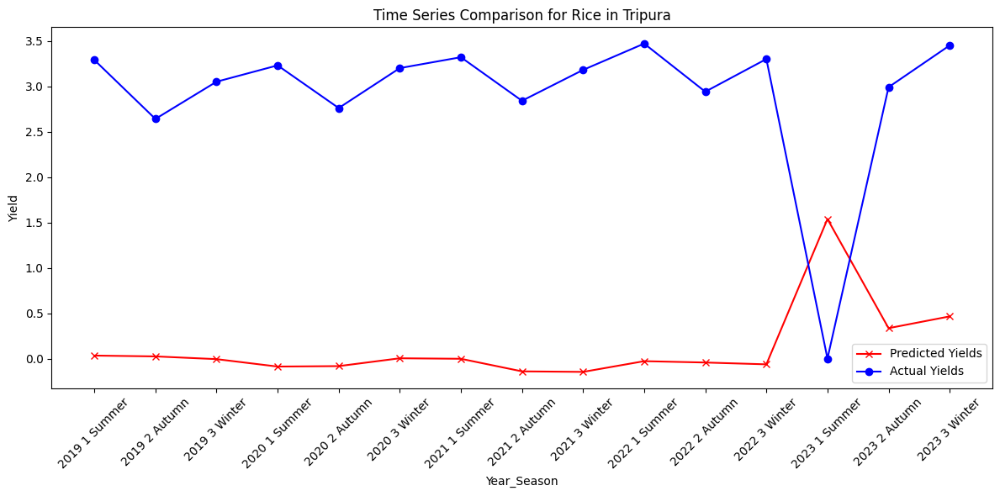

RMSE for Rice in Tripura: 3.0318738751575594


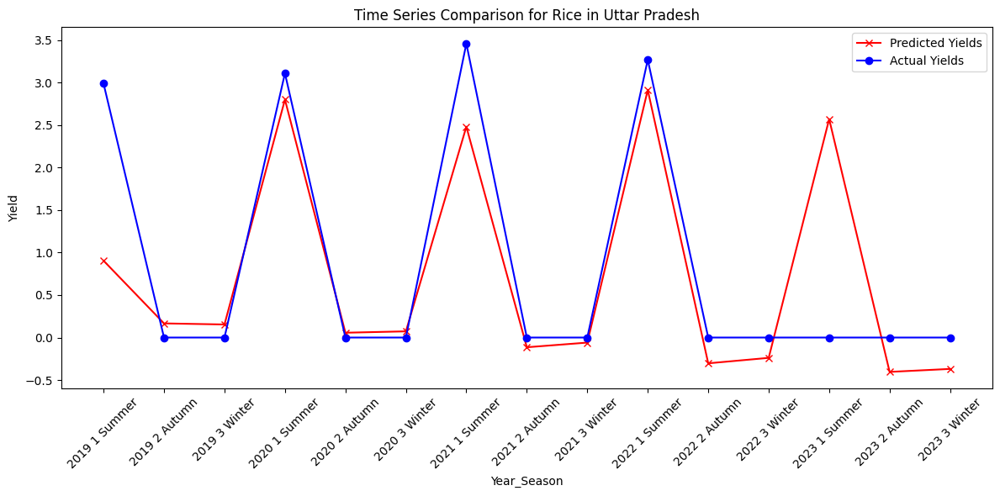

RMSE for Rice in Uttar Pradesh: 0.9188545908532476


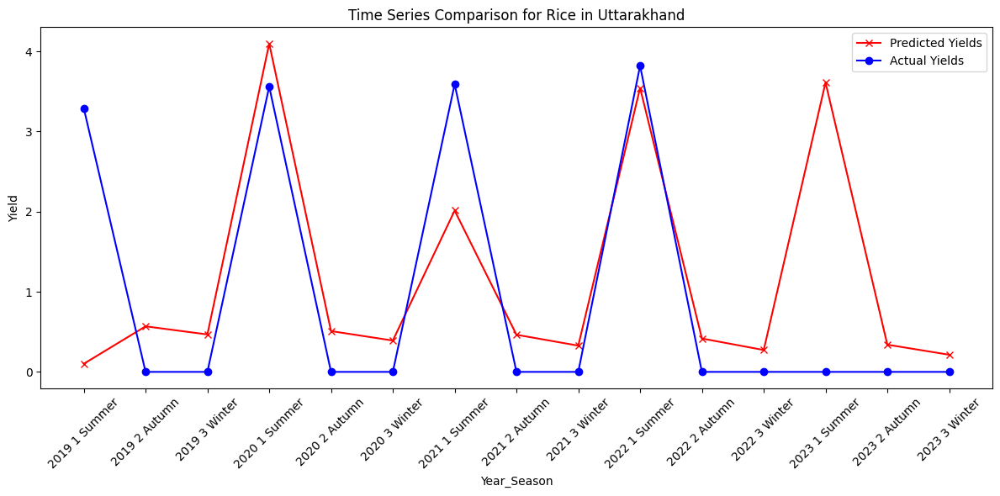

RMSE for Rice in Uttarakhand: 1.3600470239486935


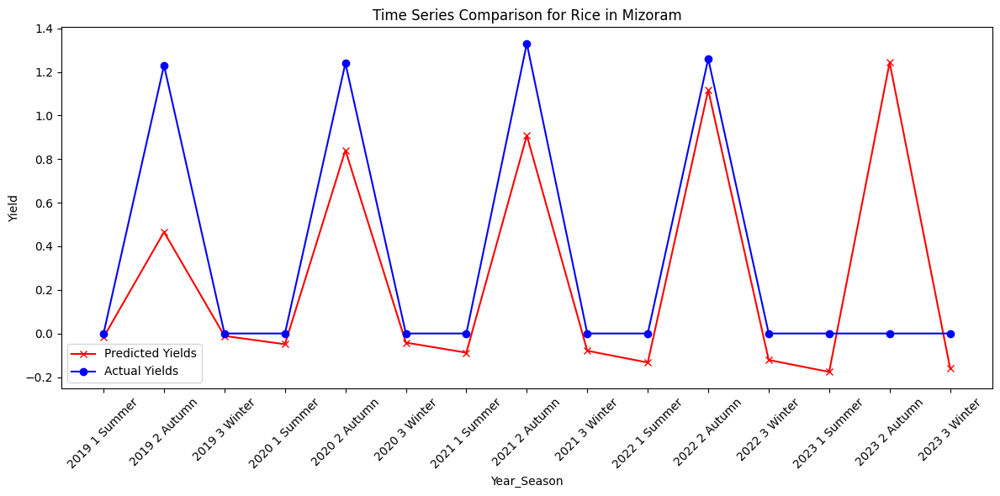

RMSE for Rice in Mizoram: 0.41596249305970834


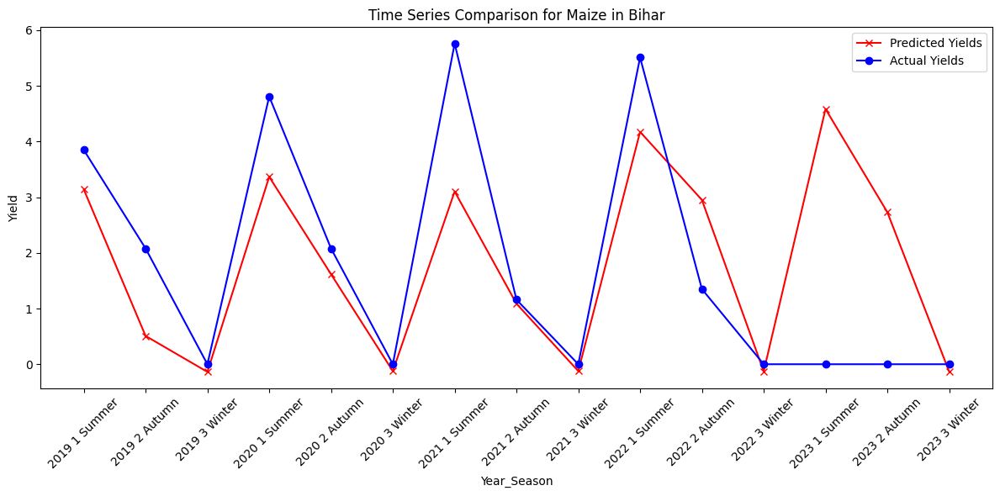

RMSE for Maize in Bihar: 1.7367121792545261


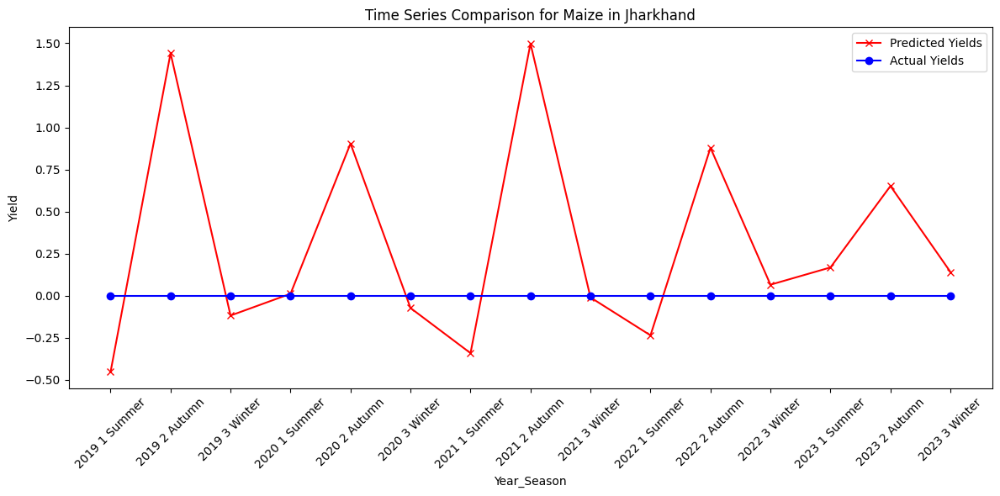

RMSE for Maize in Jharkhand: 0.672544788529955


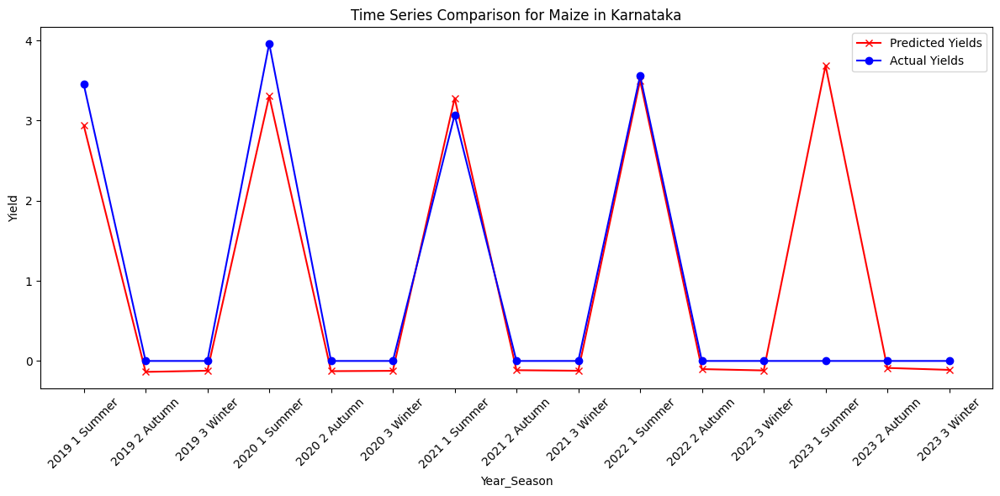

RMSE for Maize in Karnataka: 0.9820671290214429


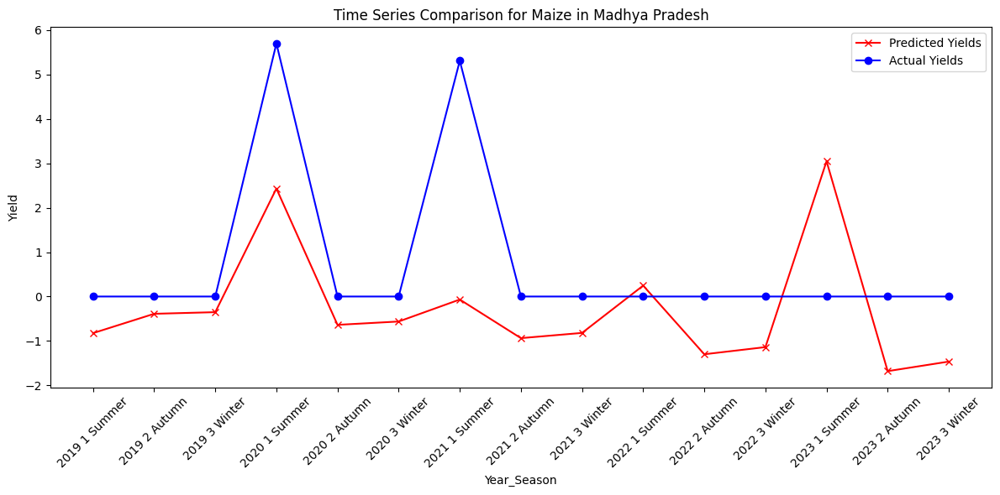

RMSE for Maize in Madhya Pradesh: 2.002460079441438


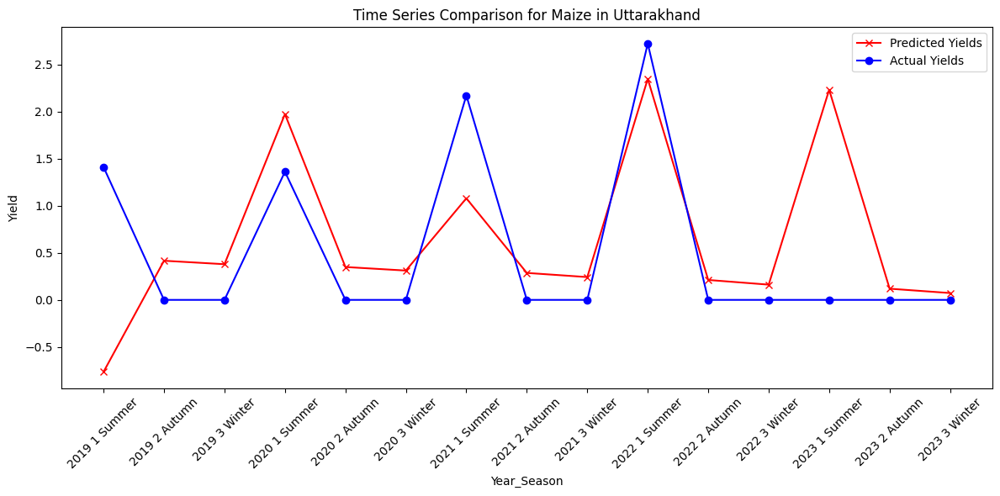

RMSE for Maize in Uttarakhand: 0.9008002805250078


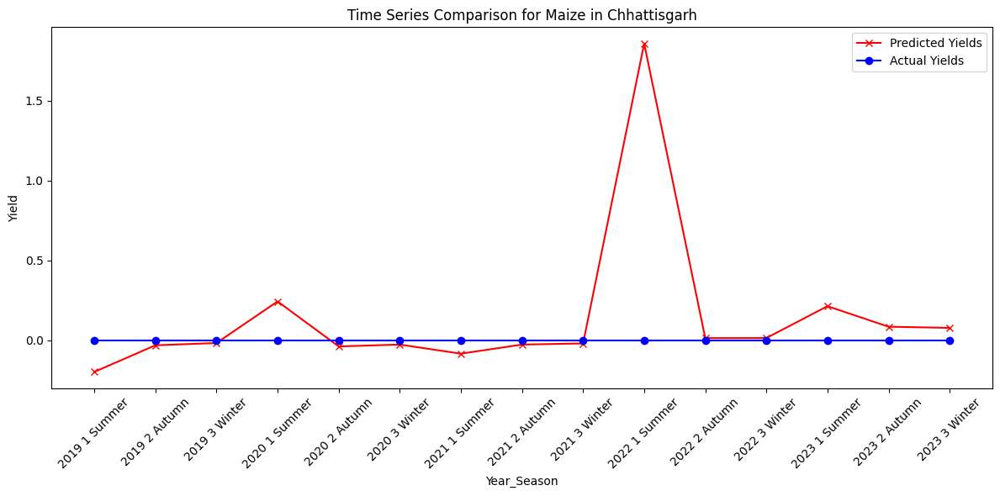

RMSE for Maize in Chhattisgarh: 0.491322260846504


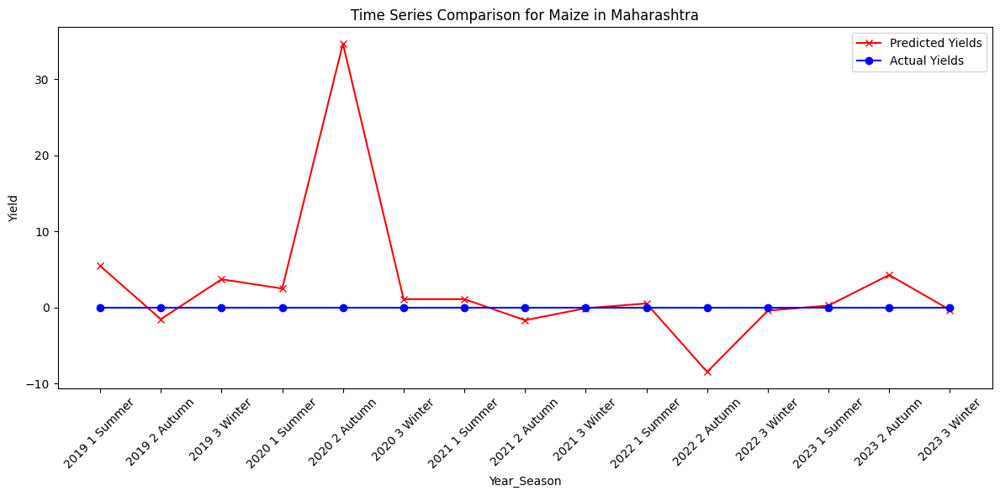

RMSE for Maize in Maharashtra: 9.489422516022984


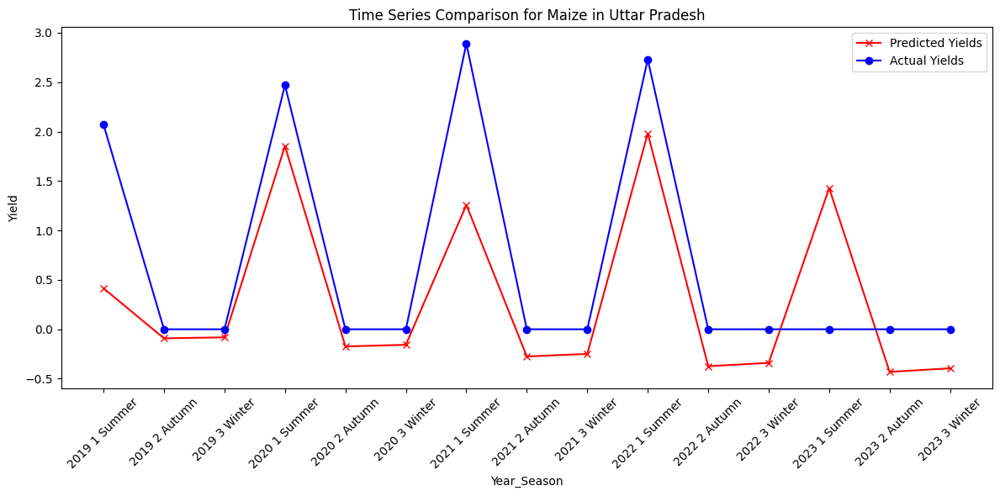

RMSE for Maize in Uttar Pradesh: 0.7825690252856807


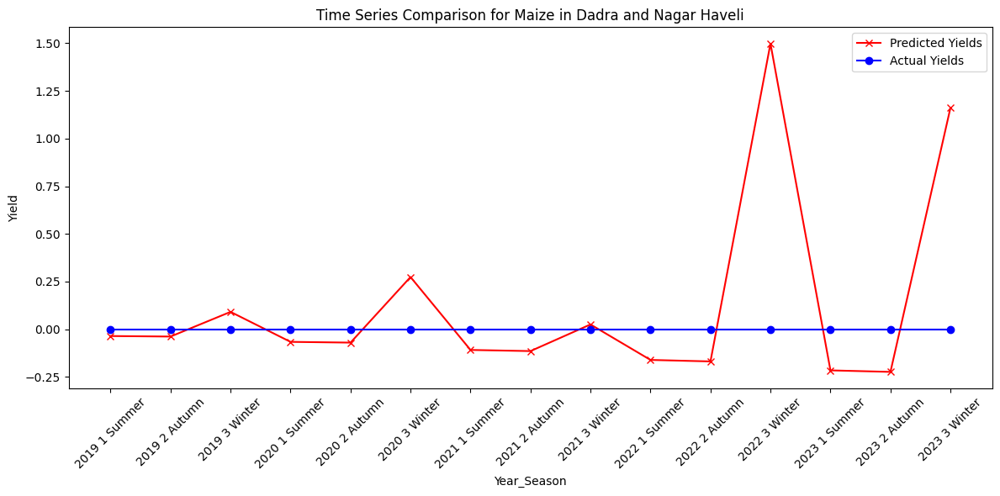

RMSE for Maize in Dadra and Nagar Haveli: 0.5075363390938886


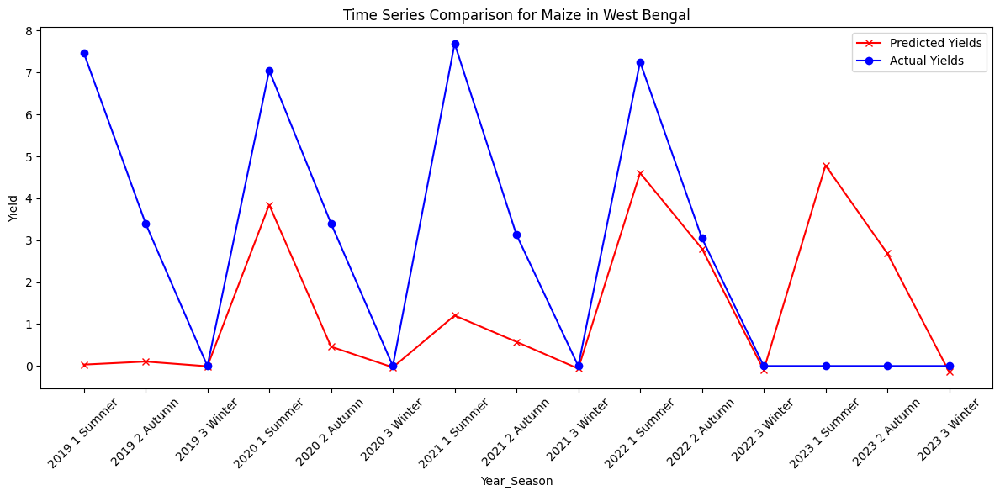

RMSE for Maize in West Bengal: 3.3747680449390653


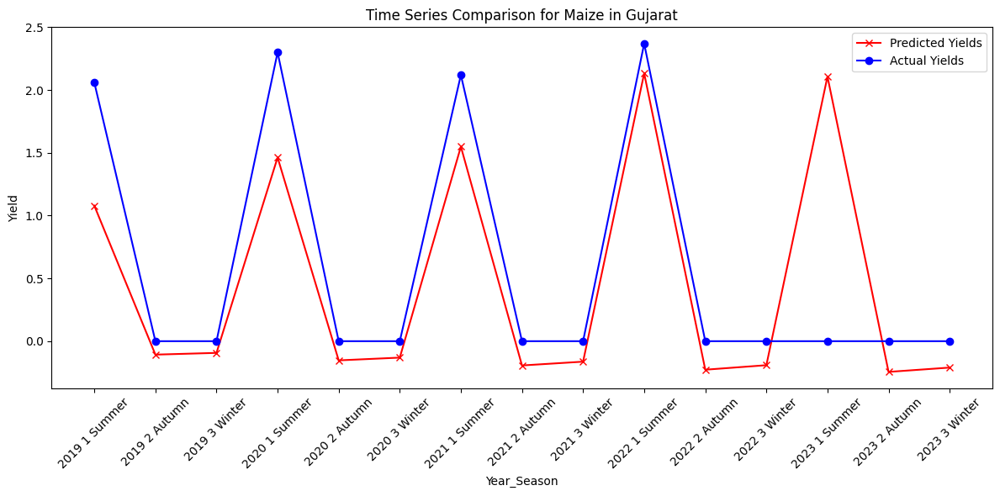

RMSE for Maize in Gujarat: 0.6734104290761443


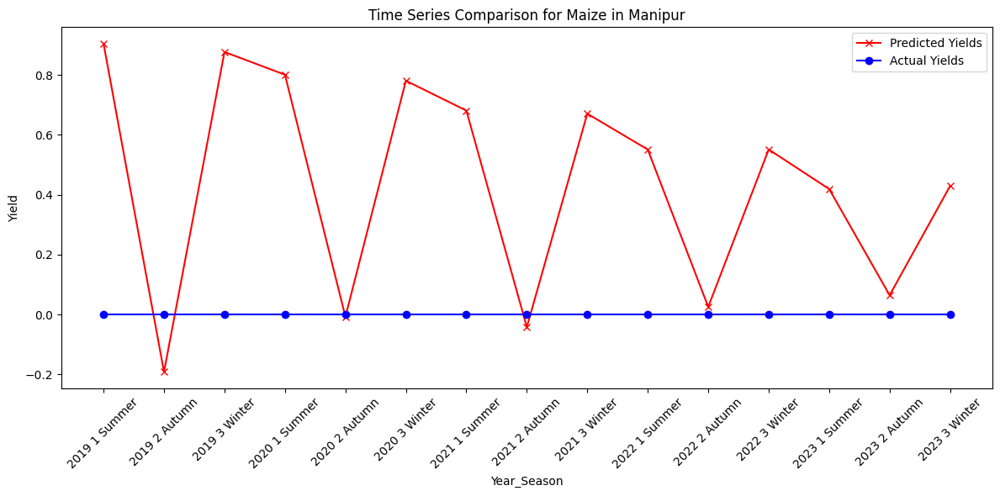

RMSE for Maize in Manipur: 0.5635626508058031


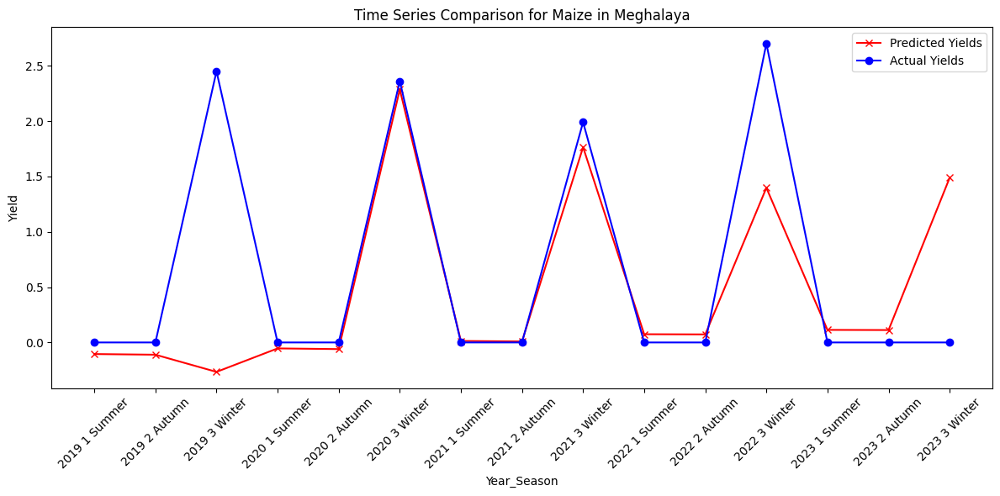

RMSE for Maize in Meghalaya: 0.8721807502062774


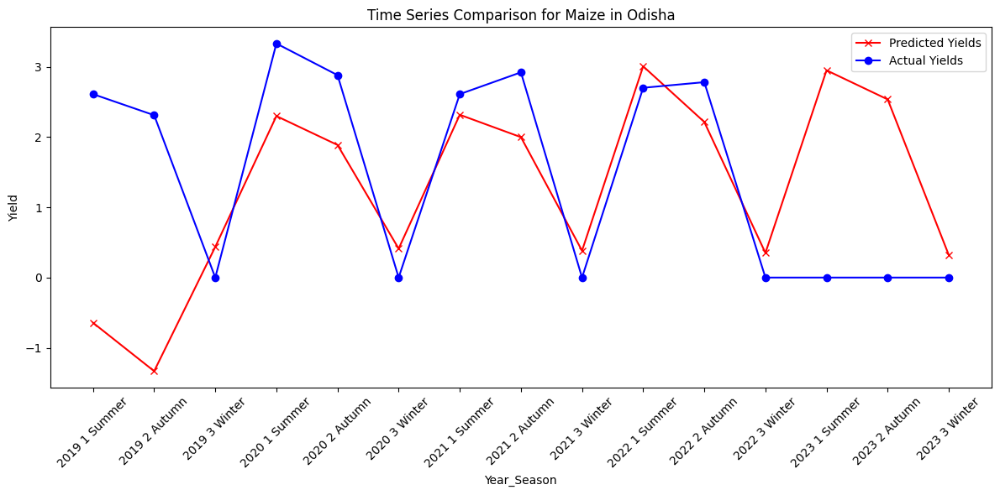

RMSE for Maize in Odisha: 1.6950366914851578


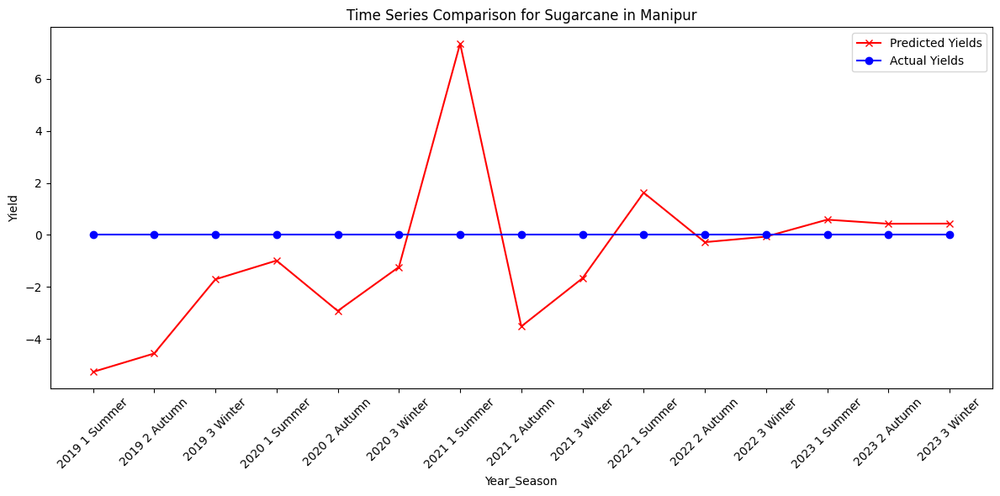

RMSE for Sugarcane in Manipur: 2.9997052810354394


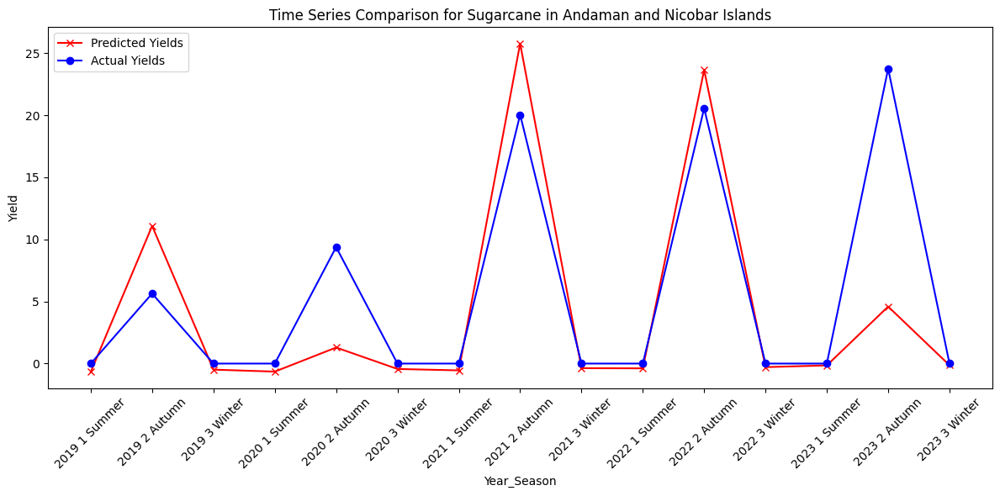

RMSE for Sugarcane in Andaman and Nicobar Islands: 5.811154651090664


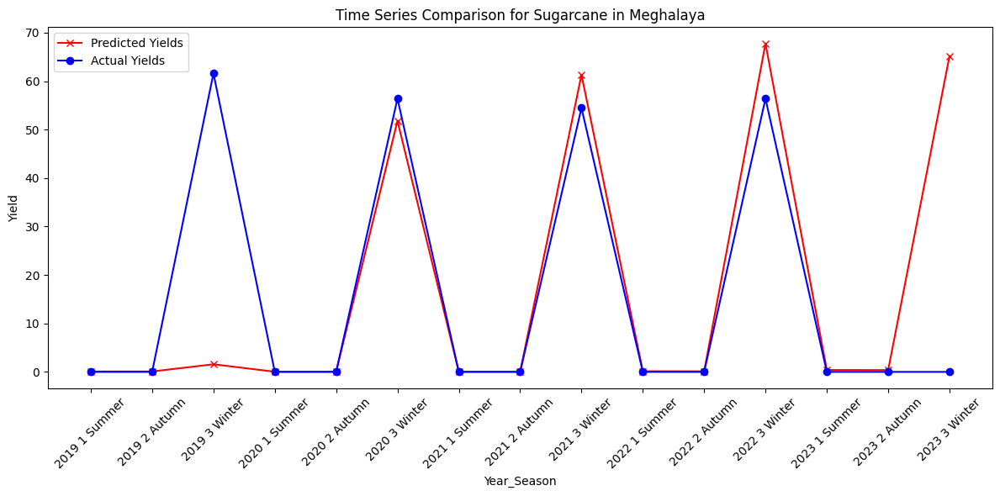

RMSE for Sugarcane in Meghalaya: 23.167864498034426


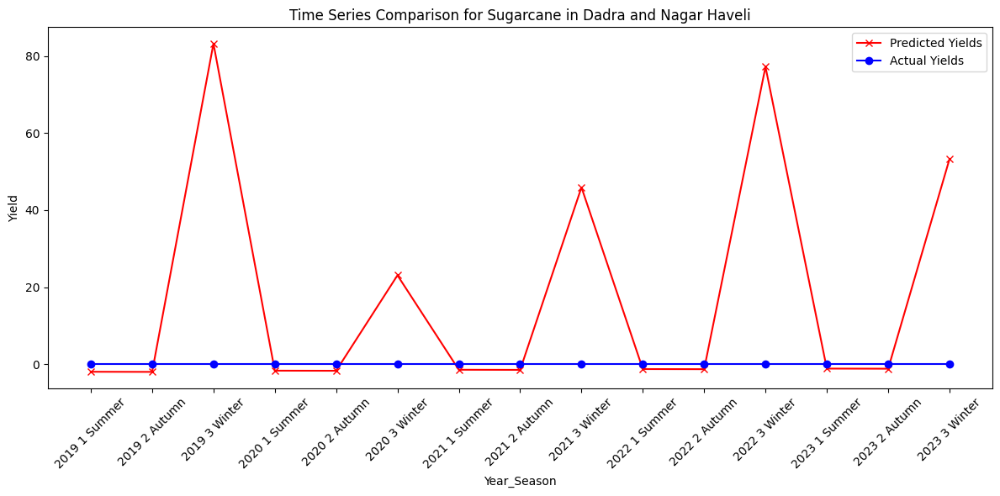

RMSE for Sugarcane in Dadra and Nagar Haveli: 35.007443195467715


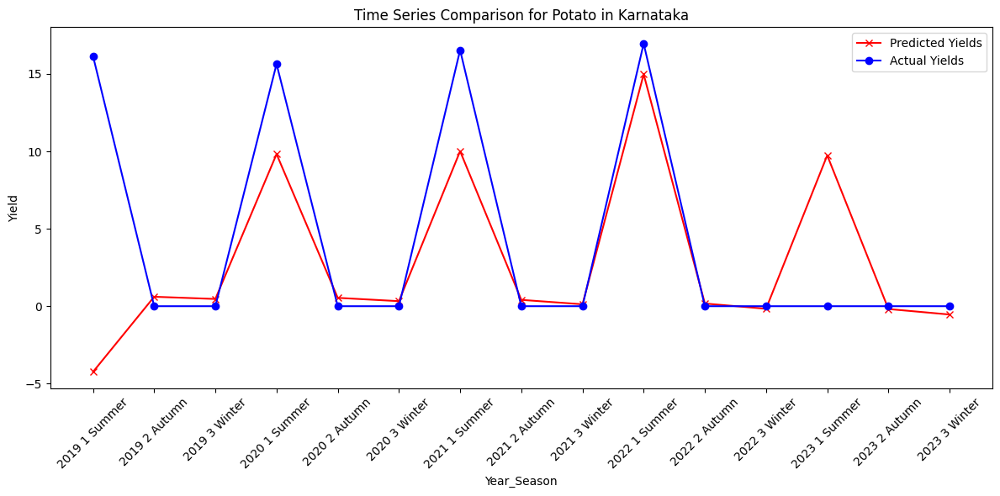

RMSE for Potato in Karnataka: 6.288193397493081


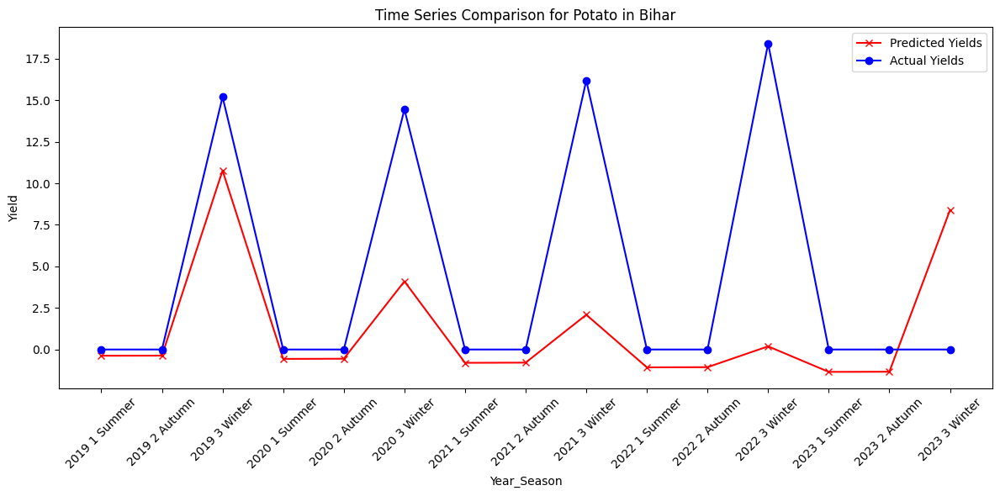

RMSE for Potato in Bihar: 7.004105361901839


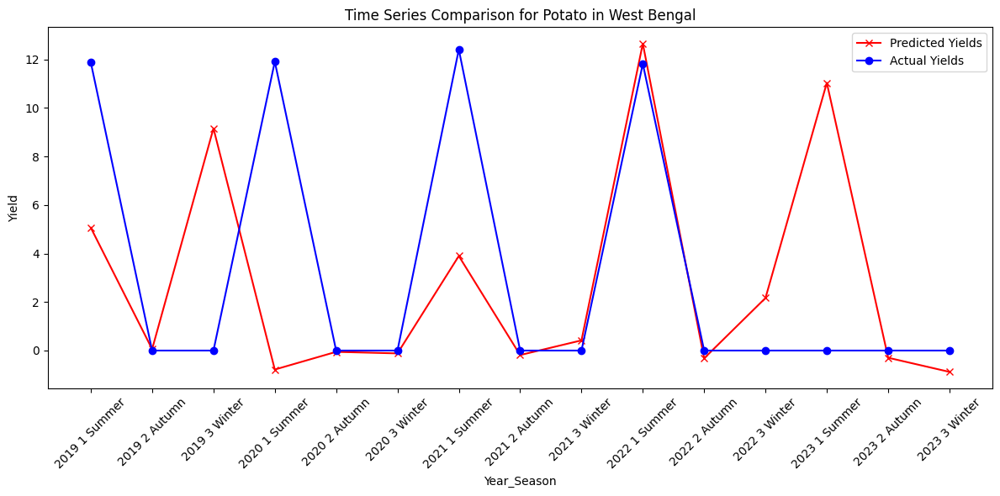

RMSE for Potato in West Bengal: 5.728620197425747


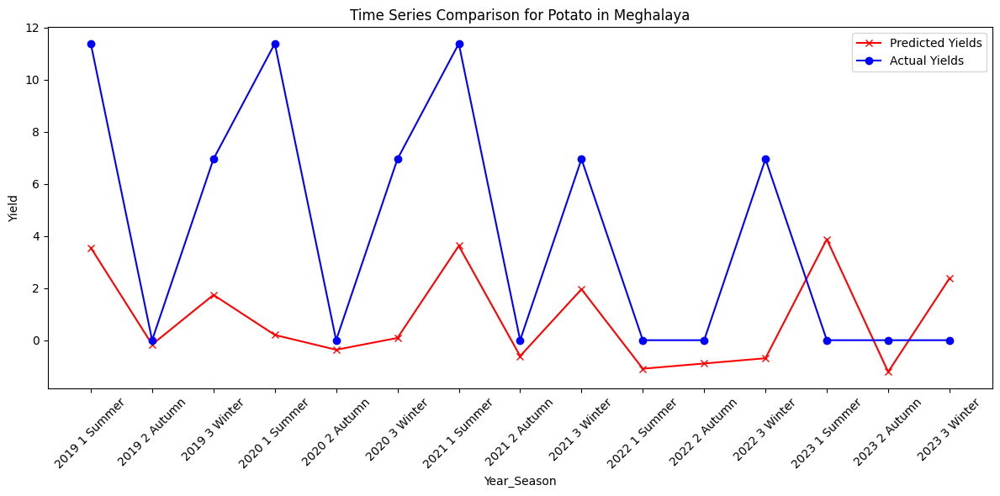

RMSE for Potato in Meghalaya: 5.346143357520444


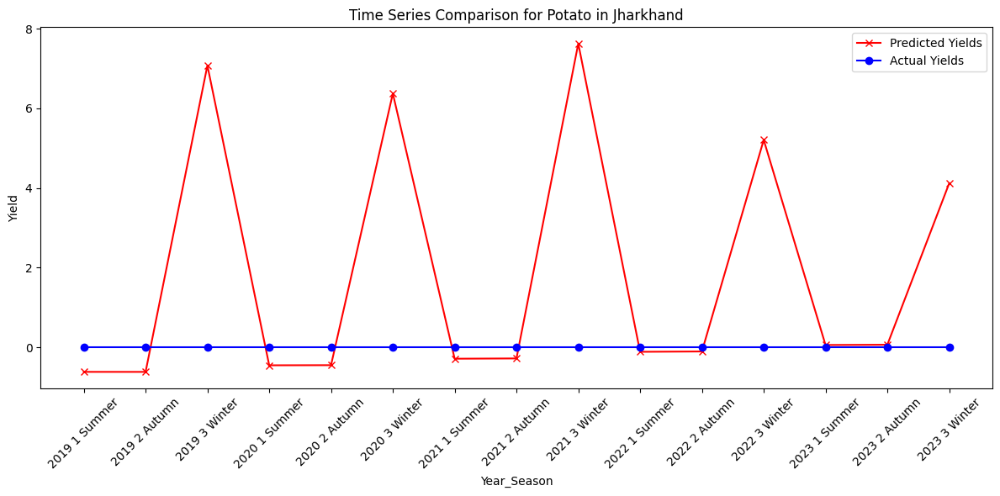

RMSE for Potato in Jharkhand: 3.5984590699683014


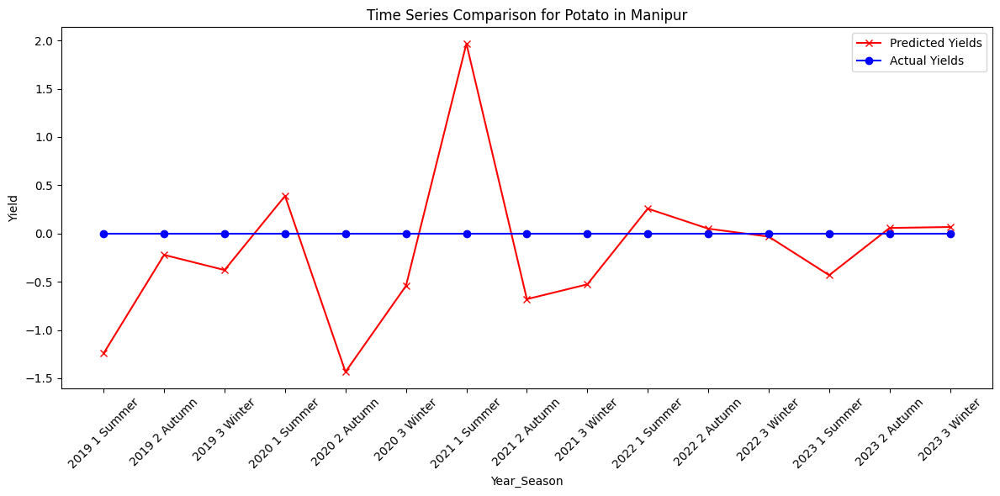

RMSE for Potato in Manipur: 0.779387872282915


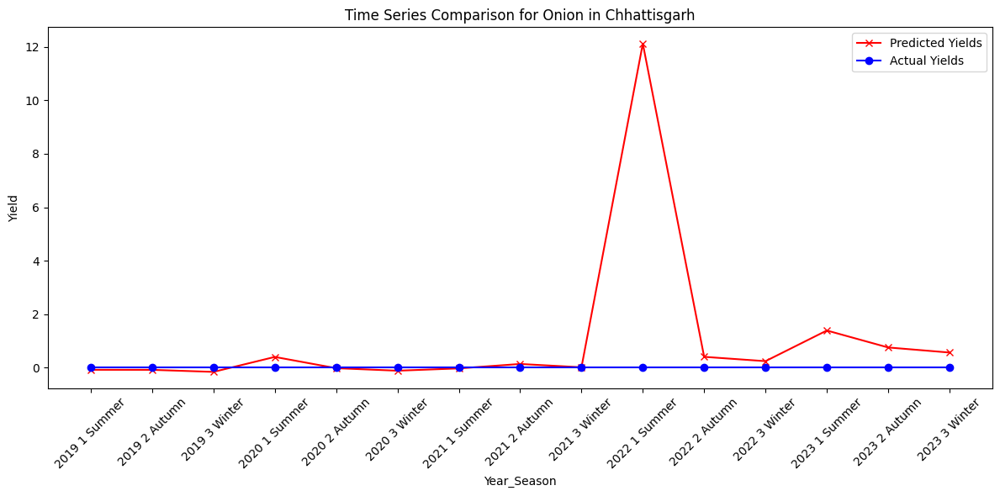

RMSE for Onion in Chhattisgarh: 3.165410108173242


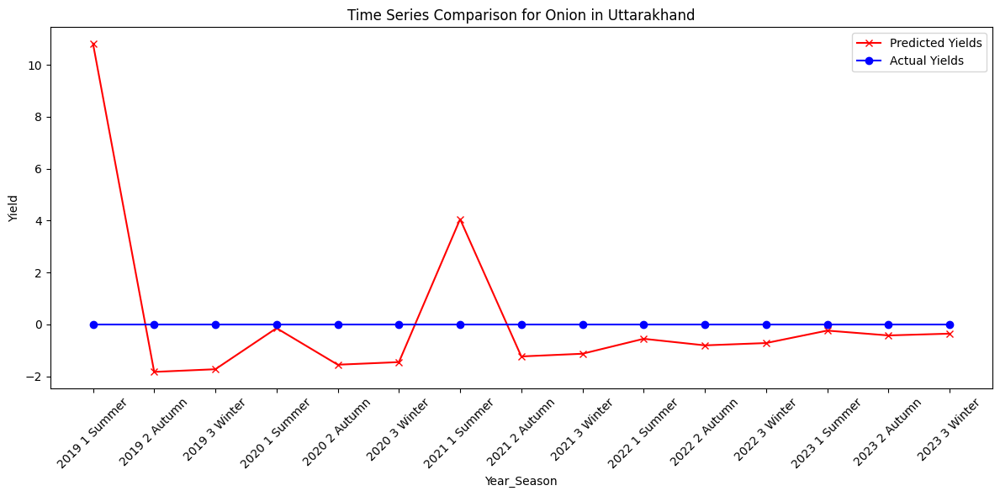

RMSE for Onion in Uttarakhand: 3.1526051133642605


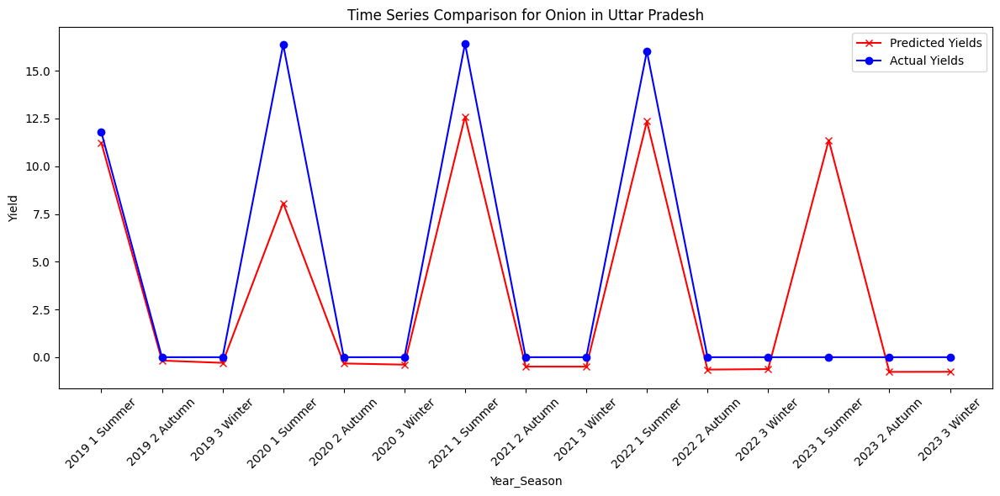

RMSE for Onion in Uttar Pradesh: 3.91024592807668


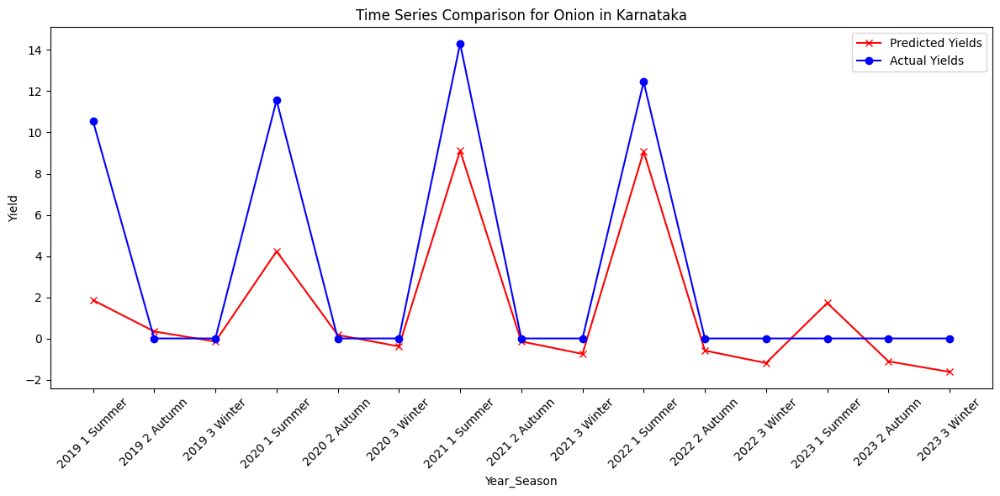

RMSE for Onion in Karnataka: 3.4370732562907294


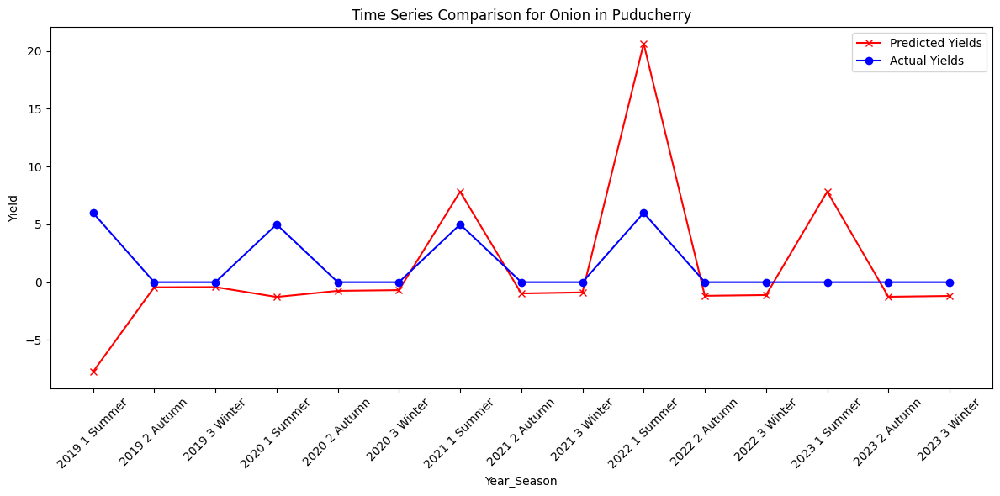

RMSE for Onion in Puducherry: 5.894632490072235


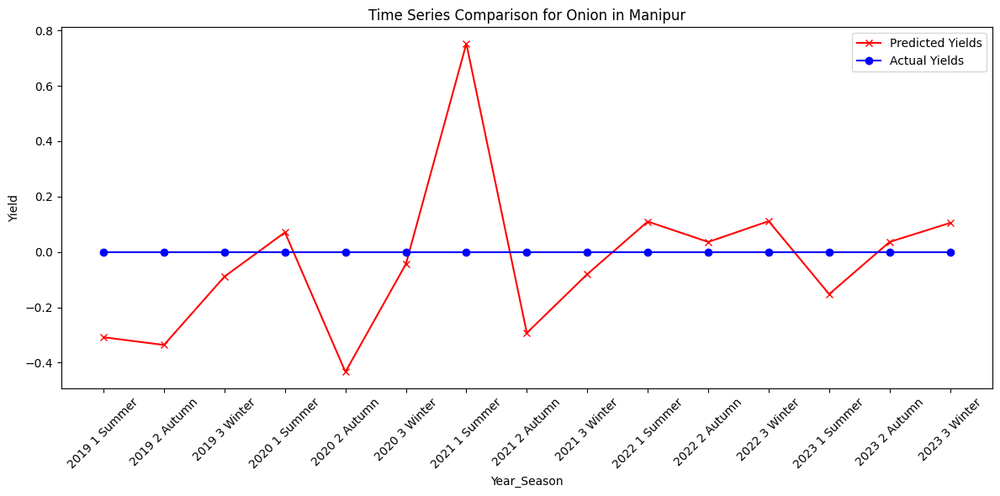

RMSE for Onion in Manipur: 0.27442480573422284


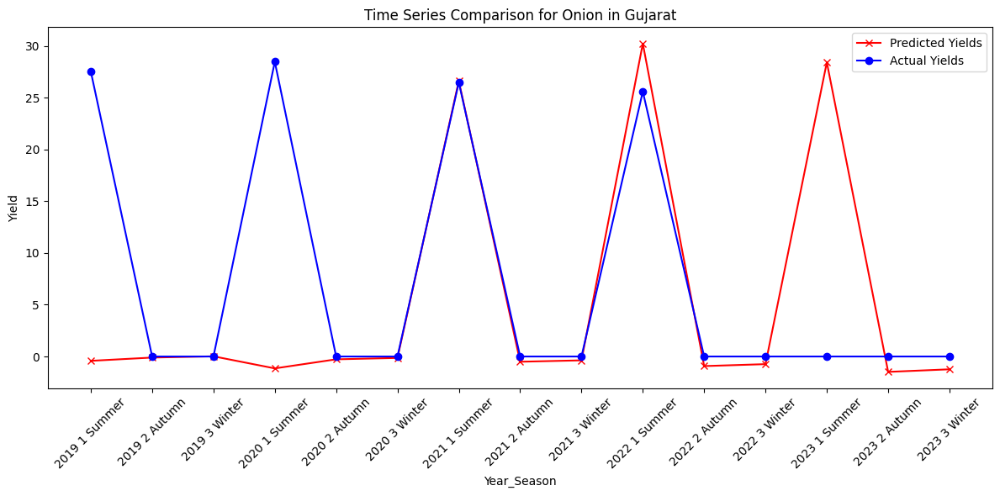

RMSE for Onion in Gujarat: 12.893369841353188


In [71]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error

for crop in selected_crops:
    for state in states_for_selected_crops[crop]:
        if state in state_level_forecasts[crop]:
            predictions = state_level_forecasts[crop][state]['predictions']
            actuals = state_level_forecasts[crop][state]['actuals']
            year_seasons = test_data['Year_Season'].unique()  # Ensure this matches your data

            # Calculate RMSE
            rmse = np.sqrt(mean_squared_error(actuals, predictions))

            plt.figure(figsize=(12, 6))
            plt.plot(year_seasons, predictions, label='Predicted Yields', color='red', marker='x')
            plt.plot(year_seasons, actuals, label='Actual Yields', color='blue', marker='o')
            plt.title(f'Time Series Comparison for {crop} in {state}')
            plt.xlabel('Year_Season')
            plt.ylabel('Yield')
            plt.xticks(rotation=45)
            plt.legend()
            plt.tight_layout()
            plt.show()

            print(f"RMSE for {crop} in {state}: {rmse}")


### National-Level Aggregation Plot

In [72]:
# Initialize dictionaries to store aggregated data over time
time_series_forecasts = {crop: {} for crop in selected_crops}
time_series_actuals = {crop: {} for crop in selected_crops}

for crop in selected_crops:
    for state in states_for_selected_crops[crop]:
        if state in state_level_forecasts[crop]:
            for i, year_season in enumerate(test_data['Year_Season'].unique()):
                if year_season not in time_series_forecasts[crop]:
                    time_series_forecasts[crop][year_season] = []
                    time_series_actuals[crop][year_season] = []

                # Aggregate predictions and actuals
                time_series_forecasts[crop][year_season].append(state_level_forecasts[crop][state]['predictions'][i])
                time_series_actuals[crop][year_season].append(state_level_forecasts[crop][state]['actuals'][i])

# Now, average the predictions and actuals for each Year_Season
for crop in selected_crops:
    for year_season in time_series_forecasts[crop]:
        time_series_forecasts[crop][year_season] = sum(time_series_forecasts[crop][year_season]) / len(time_series_forecasts[crop][year_season])
        time_series_actuals[crop][year_season] = sum(time_series_actuals[crop][year_season]) / len(time_series_actuals[crop][year_season])


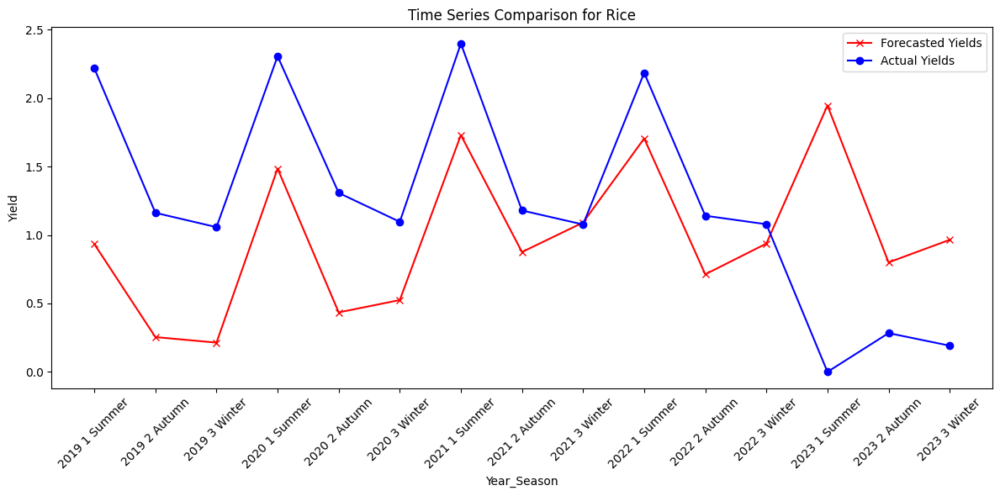

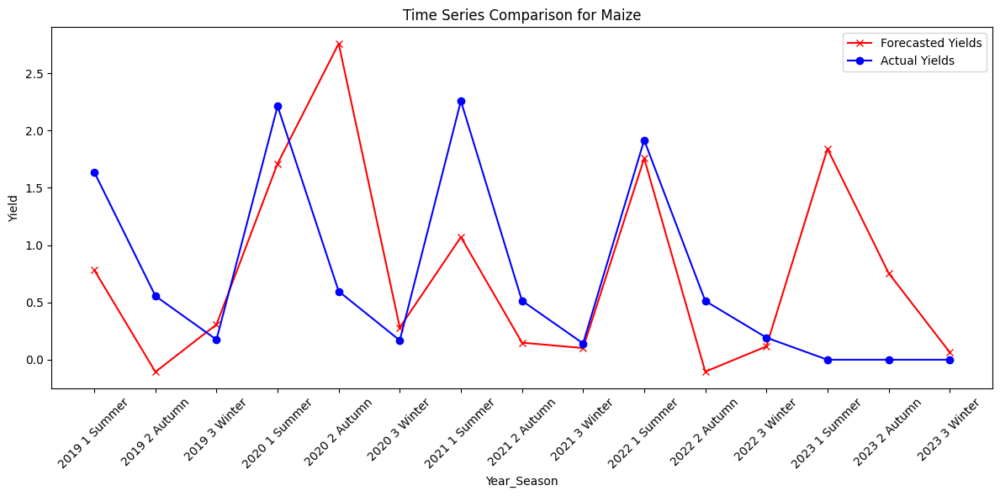

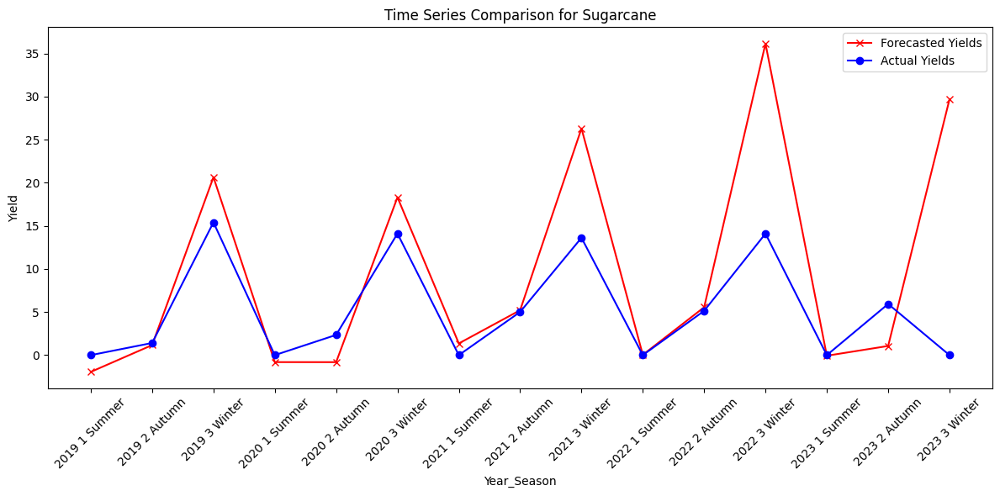

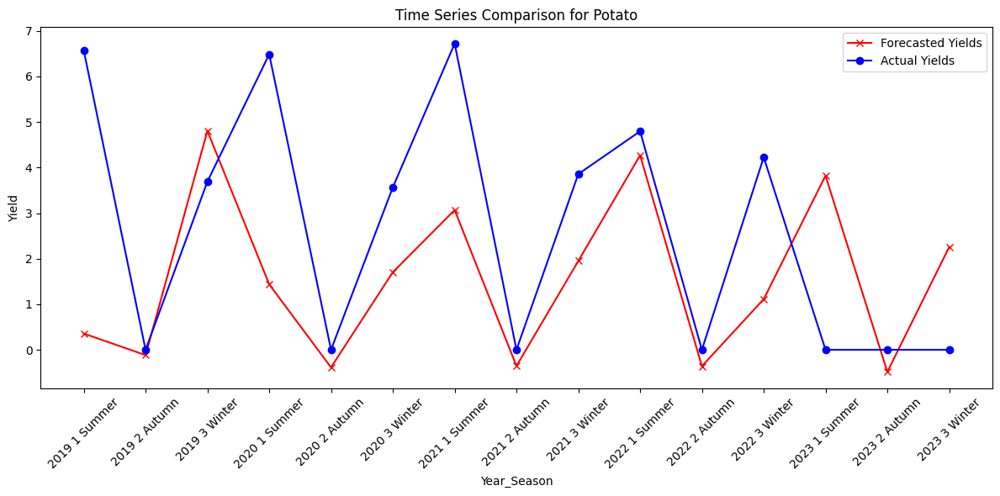

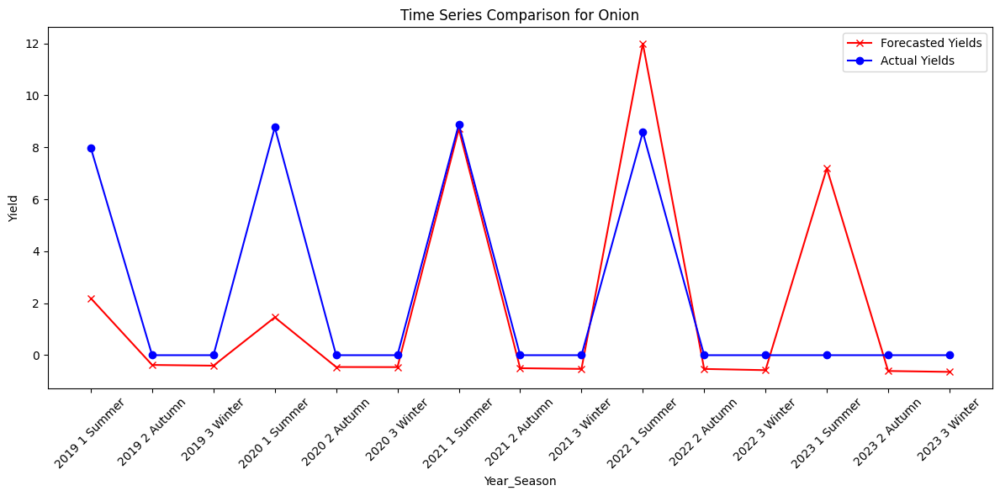

In [73]:
# Plotting time series data
for crop in selected_crops:
    year_seasons = list(time_series_forecasts[crop].keys())
    forecasted_yields = [time_series_forecasts[crop][ys] for ys in year_seasons]
    actual_yields = [time_series_actuals[crop][ys] for ys in year_seasons]

    plt.figure(figsize=(12, 6))
    plt.plot(year_seasons, forecasted_yields, label='Forecasted Yields', color='red', marker='x')
    plt.plot(year_seasons, actual_yields, label='Actual Yields', color='blue', marker='o')
    plt.title(f'Time Series Comparison for {crop}')
    plt.xlabel('Year_Season')
    plt.ylabel('Yield')
    plt.xticks(rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()


In [74]:
national_level_rmse = {}

for crop in selected_crops:
    rmse_values = list(state_level_rmse[crop].values())
    if rmse_values:
        national_rmse = np.mean(rmse_values)
        national_level_rmse[crop] = national_rmse
        print(f"State combined to National level RMSE for {crop}: {national_rmse}")

# Extract all RMSE values from the dictionary
all_rmse_values = list(national_level_rmse.values())

# Calculate the average RMSE
average_rmse = np.mean(all_rmse_values) if all_rmse_values else 0

print(f"Average State Level predictions RMSE: {average_rmse}")

for crop in selected_crops:  # Ensure using selected_crops
    forecasted_yield = national_level_forecasts[crop]['national_predictions']
    actual_yield = ground_truth_national_yields.get(crop, 0)
    print(f"Crop: {crop}, Forecasted National Yield: {forecasted_yield}, Actual National Yield: {actual_yield}")



State combined to National level RMSE for Rice: 1.586325814279328
State combined to National level RMSE for Maize: 1.7674566546095625
State combined to National level RMSE for Sugarcane: 16.74654190640706
State combined to National level RMSE for Potato: 4.790818209432055
State combined to National level RMSE for Onion: 4.67539450615208
Average State Level predictions RMSE: 5.913307418176017
Crop: Rice, Forecasted National Yield: 263.0243738023564, Actual National Yield: 171.65
Crop: Maize, Forecasted National Yield: 160.87259247526526, Actual National Yield: 77.53999999999999
Crop: Sugarcane, Forecasted National Yield: 567.4058946967125, Actual National Yield: 175.22
Crop: Potato, Forecasted National Yield: 138.41316512972116, Actual National Yield: 117.61
Crop: Onion, Forecasted National Yield: 185.21930891275406, Actual National Yield: 122.27000000000001
